In [1]:
import os, sys
sys.path.append(os.getcwd())
sys.path.append("/home/shahin/codes/improved_wgan_training-master")

import time

import numpy as np
import tensorflow as tf

import tflib as lib
import tflib.ops.linear
import tflib.ops.conv2d
import tflib.ops.batchnorm
import tflib.ops.deconv2d
import tflib.save_images
import tflib.cifar10
import tflib.inception_score
import tflib.plot

import matplotlib.pyplot as plt
%matplotlib inline  
from showit import tile
import functools


/home/shahin/anaconda3/envs/tf/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/shahin/anaconda3/envs/tf/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/shahin/anaconda3/envs/tf/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/shahin/anaconda3/envs/tf/lib/python3.7/site-packages

Instructions for updating:
Use tf.gfile.GFile.




In [2]:
# Download CIFAR-10 (Python version) at
# https://www.cs.toronto.edu/~kriz/cifar.html and fill in the path to the
# extracted files here!
DATA_DIR = '/home/shahin/codes/datasets/cifar-10-batches-py'
if len(DATA_DIR) == 0:
    raise Exception('Please specify path to data directory in gan_cifar.py!')

MODE = 'wgan-gp' # Valid options are dcgan, wgan, or wgan-gp
DIM = 128 # This overfits substantially; you're probably better off with 64
LAMBDA = 10 # Gradient penalty lambda hyperparameter
CRITIC_ITERS = 5 # How many critic iterations per generator iteration
BATCH_SIZE = 64 # Batch size
ITERS = 200000 # How many generator iterations to train for
OUTPUT_DIM = 3072 # Number of pixels in CIFAR10 (3*32*32)

CONDITIONAL = False
resume=True
TB_save_path = 'summary_path'
train_enc= True
model_path='saved_model/'

In [3]:
lib.print_model_settings(locals().copy())

Uppercase local vars:
	BATCH_SIZE: 64
	CONDITIONAL: False
	CRITIC_ITERS: 5
	DATA_DIR: /home/shahin/codes/datasets/cifar-10-batches-py
	DIM: 128
	ITERS: 200000
	LAMBDA: 10
	MODE: wgan-gp
	OUTPUT_DIM: 3072


In [4]:
def LeakyReLU(x, alpha=0.2):
    return tf.maximum(alpha*x, x)

def ReLULayer(name, n_in, n_out, inputs):
    output = lib.ops.linear.Linear(name+'.Linear', n_in, n_out, inputs)
    return tf.nn.relu(output)

def LeakyReLULayer(name, n_in, n_out, inputs):
    output = lib.ops.linear.Linear(name+'.Linear', n_in, n_out, inputs)
    return LeakyReLU(output)
    
def Generator(n_samples, noise=None):
    if noise is None:
        noise = tf.random_normal([n_samples, DIM])

    L1 = lib.ops.linear.Linear('Generator.Input', 128, 4*4*4*DIM, noise)
    L1 = tf.reshape(L1, [-1, 4*DIM, 4, 4])
    BN1 = lib.ops.batchnorm.Batchnorm('Generator.BN1', [0,2,3], L1)  #(_, 512, 4, 4)
    R1 = tf.nn.relu(BN1)


    C2 = lib.ops.deconv2d.Deconv2D('Generator.2', 4*DIM, 2*DIM, 5, R1)
    BN2 = lib.ops.batchnorm.Batchnorm('Generator.BN2', [0,2,3], C2)   #(_, 256, 8, 8)
    R2 = tf.nn.relu(BN2)

    C3 = lib.ops.deconv2d.Deconv2D('Generator.3', 2*DIM, DIM, 5, R2)
    BN3 = lib.ops.batchnorm.Batchnorm('Generator.BN3', [0,2,3], C3)   #(_, 128, 16, 16)
    R3 = tf.nn.relu(BN3)

    C4 = lib.ops.deconv2d.Deconv2D('Generator.5', DIM, 3, 5, R3)

    output = tf.tanh(C4)

    return tf.reshape(output, [-1, OUTPUT_DIM]), (BN1, BN2, BN3)
    
    
def Discriminator(inputs):
    output = tf.reshape(inputs, [-1, 3, 32, 32])

    output = lib.ops.conv2d.Conv2D('Discriminator.1', 3, DIM, 5, output, stride=2)
    output = LeakyReLU(output)

    output = lib.ops.conv2d.Conv2D('Discriminator.2', DIM, 2*DIM, 5, output, stride=2)
    if MODE != 'wgan-gp':
        output = lib.ops.batchnorm.Batchnorm('Discriminator.BN2', [0,2,3], output)
    output = LeakyReLU(output)

    output = lib.ops.conv2d.Conv2D('Discriminator.3', 2*DIM, 4*DIM, 5, output, stride=2)
    if MODE != 'wgan-gp':
        output = lib.ops.batchnorm.Batchnorm('Discriminator.BN3', [0,2,3], output)
    output = LeakyReLU(output)

    output = tf.reshape(output, [-1, 4*4*4*DIM])
    output = lib.ops.linear.Linear('Discriminator.Output', 4*4*4*DIM, 1, output)

    return tf.reshape(output, [-1])

In [5]:
def nonlinearity(x):
    return tf.nn.relu(x)

def Normalize(name, inputs,labels=None):
    """This is messy, but basically it chooses between batchnorm, layernorm, 
    their conditional variants, or nothing, depending on the value of `name` and
    the global hyperparam flags."""
    if not CONDITIONAL:
        labels = None
    if CONDITIONAL and ACGAN and ('Discriminator' in name):
        labels = None

    if ('Discriminator' in name) and NORMALIZATION_D:
        return lib.ops.layernorm.Layernorm(name,[1,2,3],inputs,labels=labels,n_labels=10)
    elif ('Generator' in name) and NORMALIZATION_G:
        if labels is not None:
            return lib.ops.cond_batchnorm.Batchnorm(name,[0,2,3],inputs,labels=labels,n_labels=10)
        else:
            return lib.ops.batchnorm.Batchnorm(name,[0,2,3],inputs,fused=True)
    else:
        return inputs


def ConvMeanPool(name, input_dim, output_dim, filter_size, inputs, he_init=True, biases=True):
    output = lib.ops.conv2d.Conv2D(name, input_dim, output_dim, filter_size, inputs, he_init=he_init, biases=biases)
    output = tf.add_n([output[:,:,::2,::2], output[:,:,1::2,::2], output[:,:,::2,1::2], output[:,:,1::2,1::2]]) / 4.
    return output

def MeanPoolConv(name, input_dim, output_dim, filter_size, inputs, he_init=True, biases=True):
    output = inputs
    output = tf.add_n([output[:,:,::2,::2], output[:,:,1::2,::2], output[:,:,::2,1::2], output[:,:,1::2,1::2]]) / 4.
    output = lib.ops.conv2d.Conv2D(name, input_dim, output_dim, filter_size, output, he_init=he_init, biases=biases)
    return output

def UpsampleConv(name, input_dim, output_dim, filter_size, inputs, he_init=True, biases=True):
    output = inputs
    output = tf.concat([output, output, output, output], axis=1)
    output = tf.transpose(output, [0,2,3,1])
    output = tf.depth_to_space(output, 2)
    output = tf.transpose(output, [0,3,1,2])
    output = lib.ops.conv2d.Conv2D(name, input_dim, output_dim, filter_size, output, he_init=he_init, biases=biases)
    return output

def ResidualBlock(name, input_dim, output_dim, filter_size, inputs, resample=None, no_dropout=False, labels=None):
    """
    resample: None, 'down', or 'up'
    """
    if resample=='down':
        conv_1        = functools.partial(lib.ops.conv2d.Conv2D, input_dim=input_dim, output_dim=input_dim)
        conv_2        = functools.partial(ConvMeanPool, input_dim=input_dim, output_dim=output_dim)
        conv_shortcut = ConvMeanPool
    elif resample=='up':
        conv_1        = functools.partial(UpsampleConv, input_dim=input_dim, output_dim=output_dim)
        conv_shortcut = UpsampleConv
        conv_2        = functools.partial(lib.ops.conv2d.Conv2D, input_dim=output_dim, output_dim=output_dim)
    elif resample==None:
        conv_shortcut = lib.ops.conv2d.Conv2D
        conv_1        = functools.partial(lib.ops.conv2d.Conv2D, input_dim=input_dim, output_dim=output_dim)
        conv_2        = functools.partial(lib.ops.conv2d.Conv2D, input_dim=output_dim, output_dim=output_dim)
    else:
        raise Exception('invalid resample value')

    if output_dim==input_dim and resample==None:
        shortcut = inputs # Identity skip-connection
    else:
        shortcut = conv_shortcut(name+'.Shortcut', input_dim=input_dim, output_dim=output_dim, filter_size=1, he_init=False, biases=True, inputs=inputs)

    output = inputs
    output = Normalize(name+'.N1', output, labels=labels)
    output = nonlinearity(output)
    output = conv_1(name+'.Conv1', filter_size=filter_size, inputs=output)    
    output = Normalize(name+'.N2', output, labels=labels)
    output = nonlinearity(output)            
    output = conv_2(name+'.Conv2', filter_size=filter_size, inputs=output)

    return shortcut + output
    
    
def Enoder(inputs, labels=None):
    inputs = tf.reshape(inputs, [-1, 3, 32, 32])
    interm = ResidualBlock('Encoder.1', 3, 16, 3, inputs, resample=None, labels=labels)  #(_,128, 16, 16)
    interm = ResidualBlock('Encoder.2', 16, 32, 3, interm, resample=None, labels=labels)  #(_,128, 16, 16)
    interm = ResidualBlock('Encoder.3', 32, 64, 3, interm, resample=None, labels=labels)  #(_,128, 16, 16)
    output1 = ResidualBlock('Encoder.4', 64, DIM, 3, interm, resample='down', labels=labels)  #(_,128, 16, 16)*
    
    interm = ResidualBlock('Encoder.5', 128, 256, 3, output1, resample=None, labels=labels)  #(_,128, 16, 16)
    interm = ResidualBlock('Encoder.6', 256, 128, 3, interm, resample=None, labels=labels)  #(_,128, 16, 16)
    output2 = ResidualBlock('Encoder.7', DIM, 256, 3, interm, resample='down', labels=labels)#(_,256, 8, 8)*
    
    interm = ResidualBlock('Encoder.8', 256, 512, 3, output2, resample=None, labels=labels)  #(_,128, 16, 16)
    interm = ResidualBlock('Encoder.9', 512, 256, 3, interm, resample=None, labels=labels)  #(_,128, 16, 16)    
    output3 = ResidualBlock('Encoder.10', 256, 512, 3, interm, resample='down', labels=labels)  #(_,512, 4, 4)*
    
    interm = nonlinearity(output3)
    interm = tf.reshape(interm, [-1, 512*4*4])
    interm = lib.ops.linear.Linear('Encoder.11', 512*4*4, DIM, interm)
    output = lib.ops.batchnorm.Batchnorm('Encoder.12', [0], interm)
    return output, (output1, output2, output3)


In [6]:
# def Enoder(inputs):
#     output = tf.reshape(inputs, [-1, 3, 32, 32])
    
#     C1 = lib.ops.conv2d.Conv2D('Encoder.1', 3, DIM, 3, output, stride=1)       
#     BN1 = lib.ops.batchnorm.Batchnorm('Encoder.BN1', [0,2,3], C1)               #(_,128, 32, 32) 
#     R1 = tf.nn.relu(BN1)
    
#     C2 = lib.ops.conv2d.Conv2D('Encoder.2', DIM, 64, 3, R1, stride=1)       
#     BN2 = lib.ops.batchnorm.Batchnorm('Encoder.BN2', [0,2,3], C2)               #(_,64, 32, 32) 
#     R2 = tf.nn.relu(BN2)
    
#     C3 = lib.ops.conv2d.Conv2D('Encoder.3', 64, DIM, 3, R2, stride=1)  
#     BN3 = lib.ops.batchnorm.Batchnorm('Encoder.BN3', [0,2,3], C3)               #(_,128, 32, 32) 
#     R3 = tf.nn.relu(BN3)
    
#     C4 = lib.ops.conv2d.Conv2D('Encoder.4', DIM, DIM, 3, R3, stride=2)  
#     BN4 = lib.ops.batchnorm.Batchnorm('Encoder.BN4', [0,2,3], C4)               #(_,128, 16, 16) *
#     R4 = tf.nn.relu(BN4)
#     #--------------------------------------------------------------------
#     C5 = lib.ops.conv2d.Conv2D('Encoder.5', DIM, 64, 3, R4, stride=1)       
#     BN5 = lib.ops.batchnorm.Batchnorm('Encoder.BN5', [0,2,3], C5)               #(_,64, 16, 16) 
#     R5 = tf.nn.relu(BN5)
    
#     C6 = lib.ops.conv2d.Conv2D('Encoder.6', 64, DIM, 3, R5, stride=1)       
#     BN6 = lib.ops.batchnorm.Batchnorm('Encoder.BN6', [0,2,3], C6)              #(_,128, 16, 16) 
#     R6 = tf.nn.relu(BN6)

#     C7 = lib.ops.conv2d.Conv2D('Encoder.7', DIM, DIM, 3, R6, stride=1)  
#     BN7 = lib.ops.batchnorm.Batchnorm('Encoder.BN7', [0,2,3], C7)              #(_,128, 16, 16)
#     R7 = tf.nn.relu(BN7)
    
#     C8 = lib.ops.conv2d.Conv2D('Encoder.8', DIM, 2*DIM, 3, R7, stride=2)  
#     BN8 = lib.ops.batchnorm.Batchnorm('Encoder.BN8', [0,2,3], C8)              #(_,256, 8, 8)*
#     R8 = tf.nn.relu(BN8)
#     #--------------------------------------------------------------------
#     C9 = lib.ops.conv2d.Conv2D('Encoder.9', 2*DIM, DIM, 3, R8, stride=1)       
#     BN9 = lib.ops.batchnorm.Batchnorm('Encoder.BN9', [0,2,3], C9)              #(_,128, 8, 8) 
#     R9 = tf.nn.relu(BN9)
    
#     C10 = lib.ops.conv2d.Conv2D('Encoder.10', DIM, 2*DIM, 3, R9, stride=1)       
#     BN10 = lib.ops.batchnorm.Batchnorm('Encoder.BN10', [0,2,3], C10)              #(_,256, 8, 8) 
#     R10 = tf.nn.relu(BN10)

#     C11 = lib.ops.conv2d.Conv2D('Encoder.11', 2*DIM, 2*DIM, 3, R10, stride=1) 
#     BN11 = lib.ops.batchnorm.Batchnorm('Encoder.BN11', [0,2,3], C11)              #(_,512, 8, 8)
#     R11 = tf.nn.relu(BN11)
    
#     C12 = lib.ops.conv2d.Conv2D('Encoder.12', 2*DIM, 4*DIM, 3, R11, stride=2) 
#     BN12 = lib.ops.batchnorm.Batchnorm('Encoder.BN12', [0,2,3], C12)              #(_,512, 4, 4)*
#     R12 = tf.nn.relu(BN12)
#     R12 = tf.reshape(R12, [-1, 4*DIM*4*4])
#     #--------------------------------------------------------------------
#     L13 = lib.ops.linear.Linear('Encoder.13', 4*4*4*DIM, 2*DIM, R12)
    
#     L14 = lib.ops.linear.Linear('Encoder.Output', 2*DIM, DIM, L13)
#     BN14 = lib.ops.batchnorm.Batchnorm('Encoder.BN14', [0], L14)
    
    
#     return BN14, (BN4, BN8, BN12)

In [7]:
noise = tf.random_normal([BATCH_SIZE, DIM])

real_data_int = tf.placeholder(tf.int32, shape=[BATCH_SIZE, OUTPUT_DIM])
real_data = 2*((tf.cast(real_data_int, tf.float32)/255.)-.5)
fake_data, gen_inter = Generator(BATCH_SIZE, noise)

disc_real = Discriminator(real_data)
disc_fake = Discriminator(fake_data)

gen_params = lib.params_with_name('Generator')
disc_params = lib.params_with_name('Discriminator')


In [8]:
enc_fake, enc_inter = Enoder(fake_data)

enc_params = lib.params_with_name('Encoder')

enc_inv_gen_cost_list=[]

enc_inv_gen_cost_list.append((1/64)* tf.reduce_mean(
            tf.norm( tf.reshape(enc_inter[0]-gen_inter[2], [BATCH_SIZE,-1]), ord=2, axis=1) , 0))
enc_inv_gen_cost_list.append((1/32)* tf.reduce_mean(
            tf.norm( tf.reshape(enc_inter[1]-gen_inter[1], [BATCH_SIZE,-1]), ord=2, axis=1) , 0))
enc_inv_gen_cost_list.append((1/16)* tf.reduce_mean(
            tf.norm( tf.reshape(enc_inter[2]-gen_inter[0], [BATCH_SIZE,-1]), ord=2, axis=1) , 0))
enc_inv_gen_cost_list.append(tf.reduce_mean(
            tf.norm( tf.reshape(enc_fake - noise, [BATCH_SIZE,-1]), ord=2, axis=1) , 0))


#enc_inv_gen_cost=tf.math.add_n(enc_inv_gen_cost_list)
enc_inv_gen_cost= (enc_inv_gen_cost_list[0] +
                   enc_inv_gen_cost_list[1] +
                   enc_inv_gen_cost_list[2] +
                   enc_inv_gen_cost_list[3])

enc_inv_gen_train_enc_adam =tf.train.AdamOptimizer(learning_rate=1e-4, beta1=0.5, beta2=0.9)
enc_inv_gen_train_enc_op = enc_inv_gen_train_enc_adam.minimize(enc_inv_gen_cost, var_list=enc_params) 





In [9]:
recon_fake, _ = Generator(BATCH_SIZE, enc_fake)

enc_real, enc_recon_inter = Enoder(real_data)
recon_real, gen_recon_inter = Generator(BATCH_SIZE, enc_real)

gen_recon_cost_list=[]

gen_recon_cost_list.append((1/64)* tf.reduce_mean(
            tf.norm( tf.reshape(enc_recon_inter[0]-gen_recon_inter[2], [BATCH_SIZE,-1]), ord=2, axis=1) , 0))
gen_recon_cost_list.append((1/32)* tf.reduce_mean(
            tf.norm( tf.reshape(enc_recon_inter[1]-gen_recon_inter[1], [BATCH_SIZE,-1]), ord=2, axis=1) , 0))
gen_recon_cost_list.append((1/16)* tf.reduce_mean(
            tf.norm( tf.reshape(enc_recon_inter[2]-gen_recon_inter[0], [BATCH_SIZE,-1]), ord=2, axis=1) , 0))
gen_recon_cost_list.append(tf.reduce_mean(
            tf.norm( tf.reshape(real_data - recon_real, [BATCH_SIZE,-1]), ord=2, axis=1) , 0))


#enc_inv_gen_cost=tf.math.add_n(enc_inv_gen_cost_list)
gen_recon_cost= (
                 gen_recon_cost_list[0] +
                 gen_recon_cost_list[1] +
                 gen_recon_cost_list[2] +
                 gen_recon_cost_list[3])

gen_recon_cost_adam =tf.train.AdamOptimizer(learning_rate=1e-5, beta1=0.5, beta2=0.9)
gen_recon_cost_op = gen_recon_cost_adam.minimize(gen_recon_cost, var_list=gen_params) 

#----------------------------------------------------------

In [10]:
if MODE == 'wgan':
    gen_cost = -tf.reduce_mean(disc_fake)
    disc_cost = tf.reduce_mean(disc_fake) - tf.reduce_mean(disc_real)

    gen_train_op = tf.train.RMSPropOptimizer(learning_rate=5e-5).minimize(gen_cost, var_list=gen_params)
    disc_train_op = tf.train.RMSPropOptimizer(learning_rate=5e-5).minimize(disc_cost, var_list=disc_params)

    clip_ops = []
    for var in disc_params:
        clip_bounds = [-.01, .01]
        clip_ops.append(
            tf.assign(
                var, 
                tf.clip_by_value(var, clip_bounds[0], clip_bounds[1])
            )
        )
    clip_disc_weights = tf.group(*clip_ops)

elif MODE == 'wgan-gp':
    # Standard WGAN loss
    gen_cost = -tf.reduce_mean(disc_fake)
    disc_cost = tf.reduce_mean(disc_fake) - tf.reduce_mean(disc_real)

    # Gradient penalty
    alpha = tf.random_uniform(
        shape=[BATCH_SIZE,1], 
        minval=0.,
        maxval=1.
    )
    differences = fake_data - real_data
    interpolates = real_data + (alpha*differences)
    gradients = tf.gradients(Discriminator(interpolates), [interpolates])[0]
    slopes = tf.sqrt(tf.reduce_sum(tf.square(gradients), reduction_indices=[1]))
    gradient_penalty = tf.reduce_mean((slopes-1.)**2)
    disc_cost += LAMBDA*gradient_penalty
    
    
    #gen_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS, scope='Generator')
    
    gen_train_op = tf.train.AdamOptimizer(learning_rate=1e-4, beta1=0.5, beta2=0.9).minimize(gen_cost, var_list=gen_params)
    disc_train_op = tf.train.AdamOptimizer(learning_rate=1e-4, beta1=0.5, beta2=0.9).minimize(disc_cost, var_list=disc_params)

elif MODE == 'dcgan':
    gen_cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(disc_fake, tf.ones_like(disc_fake)))
    disc_cost =  tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(disc_fake, tf.zeros_like(disc_fake)))
    disc_cost += tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(disc_real, tf.ones_like(disc_real)))
    disc_cost /= 2.

    gen_train_op = tf.train.AdamOptimizer(learning_rate=2e-5, beta1=0.5).minimize(gen_cost,
                                                            var_list=gen_params)
    disc_train_op = tf.train.AdamOptimizer(learning_rate=2e-5, beta1=0.5).minimize(disc_cost,
                                                            var_list=disc_params)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [11]:
# For generating samples
fixed_noise_128 = tf.constant(np.random.normal(size=(128, 128)).astype('float32'))
fixed_noise_samples_128, _ = Generator(128, noise=fixed_noise_128)
def generate_image(frame, true_dist):
    samples = session.run(fixed_noise_samples_128 )
    samples = ((samples+1.)*(255./2)).astype('int32')
    lib.save_images.save_images(samples.reshape((128, 3, 32, 32)), 'samples_{}.jpg'.format(frame))


In [12]:
# For calculating inception score
samples_100, _ = Generator(100)
def get_inception_score():
    all_samples = []
    for i in range(10):
        all_samples.append(session.run(samples_100))
    all_samples = np.concatenate(all_samples, axis=0)
    all_samples = ((all_samples+1.)*(255./2)).astype('int32')
    all_samples = all_samples.reshape((-1, 3, 32, 32)).transpose(0,2,3,1)
    return lib.inception_score.get_inception_score(list(all_samples))

In [13]:
# Dataset iterators
train_gen, dev_gen = lib.cifar10.load(BATCH_SIZE, data_dir=DATA_DIR)
def inf_train_gen():
    while True:
        for images,_ in train_gen():
            yield images

In [14]:
def plot_enc_loss(enc_inv_gen_cost_list_np_Arx, enc_inv_gen_cost_np_Arx, itr):
    
    enc_inv_gen_cost_list_np_Arx=np.array(enc_inv_gen_cost_list_np_Arx)
    fig, axs = plt.subplots(1, 5, constrained_layout=True, squeeze=True, figsize=(16, 4))
    axs[0].plot(enc_inv_gen_cost_list_np_Arx[:,0])
    axs[0].set_title('Intermediate layer 1')
    axs[0].set_xlabel('Iteration')
    axs[0].set_ylabel('Loss')
    fig.suptitle('Global Iteration '+ str(itr))

    axs[1].plot(enc_inv_gen_cost_list_np_Arx[:,1])
    axs[1].set_xlabel('Iteration')
    axs[1].set_title('Intermediate layer 2')
    axs[1].set_ylabel('Loss')

    axs[2].plot(enc_inv_gen_cost_list_np_Arx[:,2])
    axs[2].set_xlabel('Iteration')
    axs[2].set_title('Intermediate layer 3')
    axs[2].set_ylabel('Loss')

    axs[3].plot(enc_inv_gen_cost_list_np_Arx[:,3])
    axs[3].set_xlabel('Iteration')
    axs[3].set_title('Last layer')
    axs[3].set_ylabel('Loss')
    
    axs[4].plot(enc_inv_gen_cost_np_Arx)
    axs[4].set_xlabel('Iteration')
    axs[4].set_title('Total loss')
    axs[4].set_ylabel('Loss')   

    plt.show()

Restoring the model:
Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from saved_model/wgan_impr
Model is restored.
iter 0	train disc cost	-2.9865000247955322	time	1.7132
iter 1	train disc cost	-2.920099973678589	time	0.4208
iter 2	train disc cost	-1.9735000133514404	time	0.1506
iter 3	train disc cost	-2.5037999153137207	time	0.1505
iter 4	train disc cost	-2.7007999420166016	time	0.1515
iter 99	train disc cost	-2.5026135444641113	time	0.15437684210526312	dev disc cost	-1.0650999546051025
iter 199	train disc cost	-2.515233039855957	time	0.155442	dev disc cost	-1.0113999843597412
iter 299	train disc cost	-2.419326066970825	time	0.155113	dev disc cost	-1.0679999589920044
iter 399	train disc cost	-2.472651958465576	time	0.15613	dev disc cost	-1.1026999950408936
iter 499	train disc cost	-2.4712181091308594	time	0.15649400000000002	dev disc cost	-1.091599941253662
iter 599	train disc cost	-2.483322858810425	time	0.155

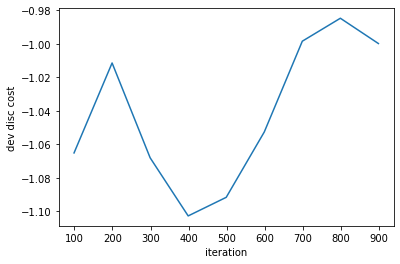

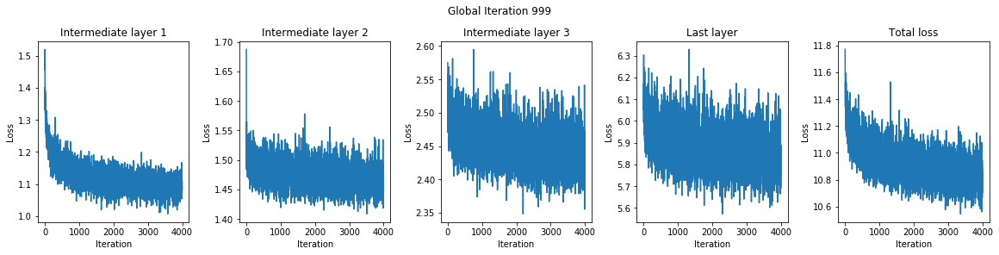

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


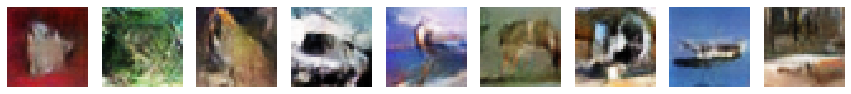

Reconstructed images:


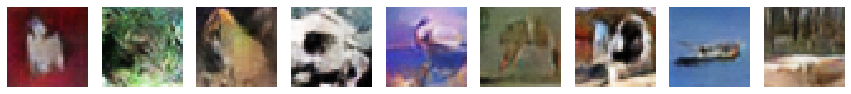

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


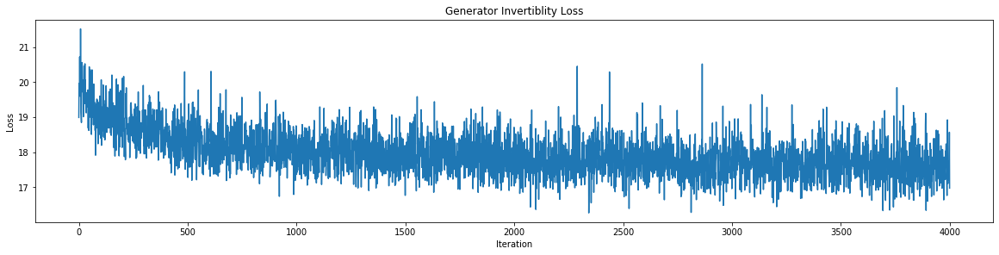

Real images:


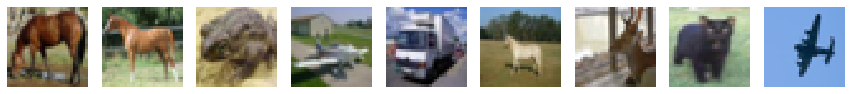

Reconstructed images:


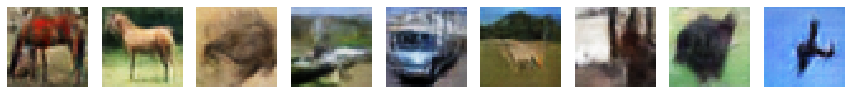

Reconstructed images after training:


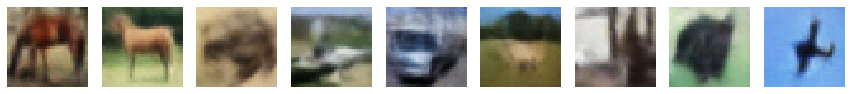

iter 999	train disc cost	-2.409472942352295	time	0.15664799999999998	inception score	5.834531307220459	dev disc cost	-1.111299991607666
iter 1099	train disc cost	-2.9196109771728516	time	0.156645	dev disc cost	-1.1175999641418457
iter 1199	train disc cost	-2.545210838317871	time	0.155984	dev disc cost	-1.3386000394821167
iter 1299	train disc cost	-2.5259718894958496	time	0.157001	dev disc cost	-1.1694999933242798
iter 1399	train disc cost	-2.4787850379943848	time	0.156832	dev disc cost	-1.108299970626831
iter 1499	train disc cost	-2.485363006591797	time	0.15611	dev disc cost	-0.9605000019073486
iter 1599	train disc cost	-2.5334067344665527	time	0.15664199999999998	dev disc cost	-1.0443999767303467
iter 1699	train disc cost	-2.474799156188965	time	0.156859	dev disc cost	-1.0202000141143799
iter 1799	train disc cost	-2.4528141021728516	time	0.15618799999999997	dev disc cost	-1.0778000354766846
iter 1899	train disc cost	-2.493504285812378	time	0.156855	dev disc cost	-1.0231000185012817
==

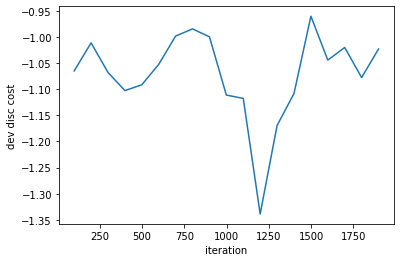

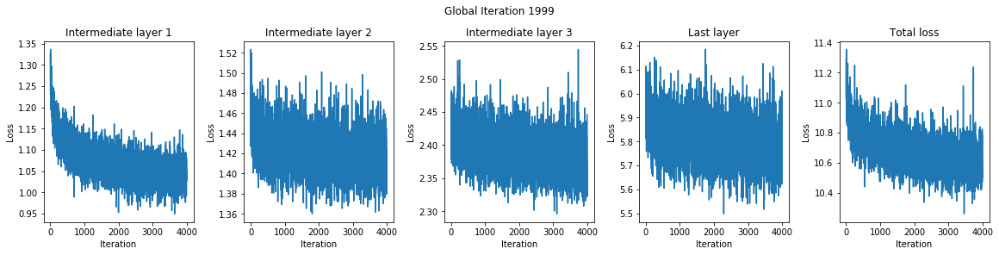

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


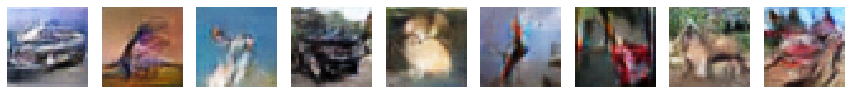

Reconstructed images:


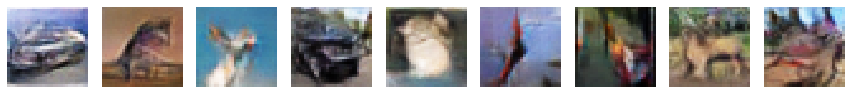

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


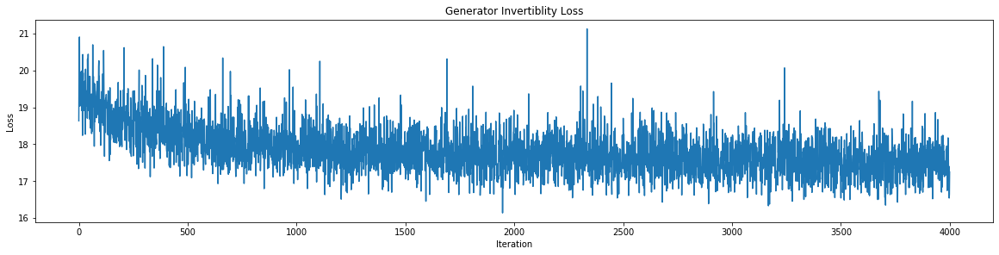

Real images:


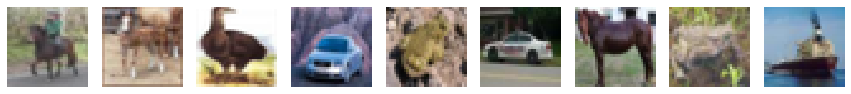

Reconstructed images:


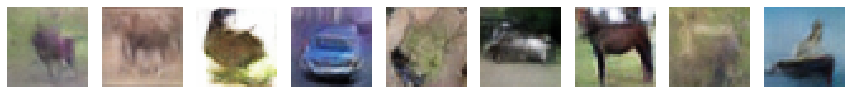

Reconstructed images after training:


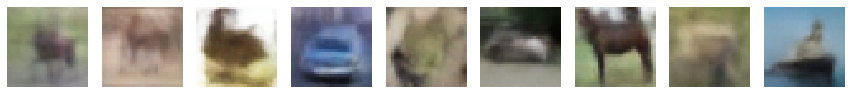

iter 1999	train disc cost	-2.462074041366577	time	0.15615199999999999	inception score	5.6359028816223145	dev disc cost	-0.5641999840736389
iter 2099	train disc cost	-2.9876480102539062	time	0.156638	dev disc cost	-1.1749999523162842
iter 2199	train disc cost	-2.5707809925079346	time	0.157273	dev disc cost	-1.1441999673843384
iter 2299	train disc cost	-2.4876890182495117	time	0.15658899999999998	dev disc cost	-1.1971999406814575
iter 2399	train disc cost	-2.5212819576263428	time	0.15728399999999998	dev disc cost	-1.1749999523162842
iter 2499	train disc cost	-2.567091941833496	time	0.15728	dev disc cost	-1.0927000045776367
iter 2599	train disc cost	-2.488697052001953	time	0.156496	dev disc cost	-0.9114999771118164
iter 2699	train disc cost	-2.532504081726074	time	0.157424	dev disc cost	-1.0388000011444092
iter 2799	train disc cost	-2.4910998344421387	time	0.157188	dev disc cost	-1.0650999546051025
iter 2899	train disc cost	-2.426056146621704	time	0.156447	dev disc cost	-1.153499960899353

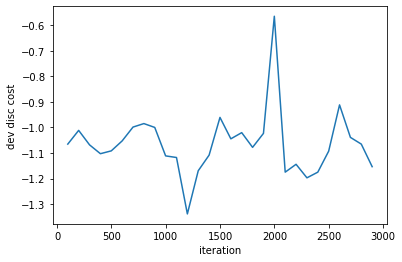

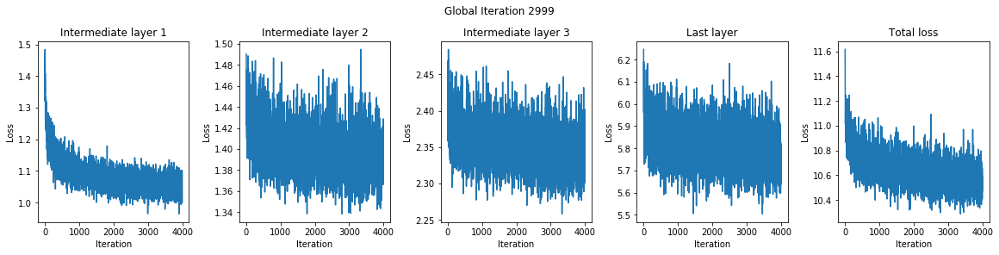

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


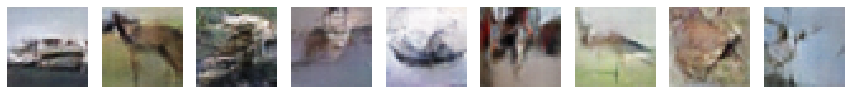

Reconstructed images:


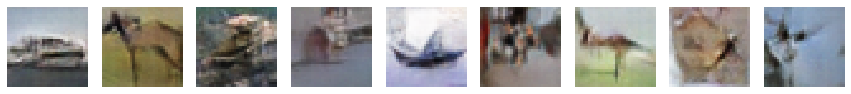

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


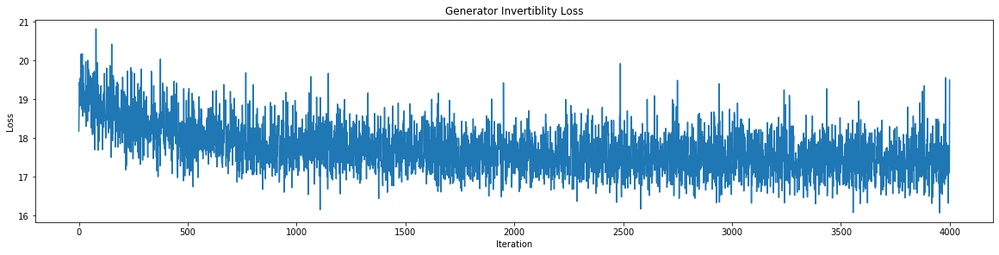

Real images:


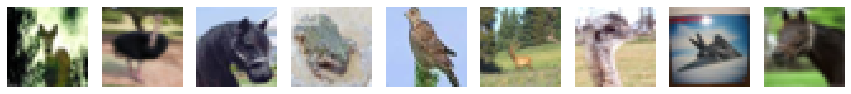

Reconstructed images:


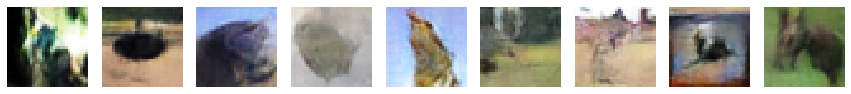

Reconstructed images after training:


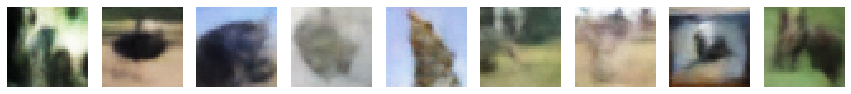

iter 2999	train disc cost	-2.5311107635498047	time	0.15748099999999998	inception score	5.709695816040039	dev disc cost	-1.5631999969482422
iter 3099	train disc cost	-2.9909660816192627	time	0.157557	dev disc cost	-1.1085000038146973
iter 3199	train disc cost	-2.5367069244384766	time	0.15624500000000002	dev disc cost	-1.1885000467300415
iter 3299	train disc cost	-2.5826361179351807	time	0.15717599999999998	dev disc cost	-1.0746999979019165
iter 3399	train disc cost	-2.5259599685668945	time	0.157192	dev disc cost	-1.115399956703186
iter 3499	train disc cost	-2.4730119705200195	time	0.156547	dev disc cost	-1.0979000329971313
iter 3599	train disc cost	-2.5259029865264893	time	0.157467	dev disc cost	-1.1328999996185303
iter 3699	train disc cost	-2.487597942352295	time	0.157448	dev disc cost	-1.007599949836731
iter 3799	train disc cost	-2.492225170135498	time	0.156156	dev disc cost	-1.0152000188827515
iter 3899	train disc cost	-2.567347526550293	time	0.157341	dev disc cost	-1.127500057220459

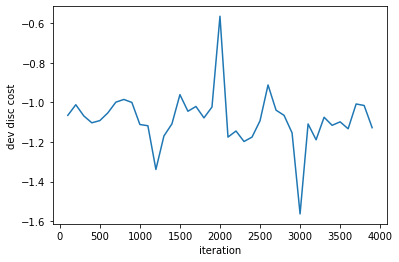

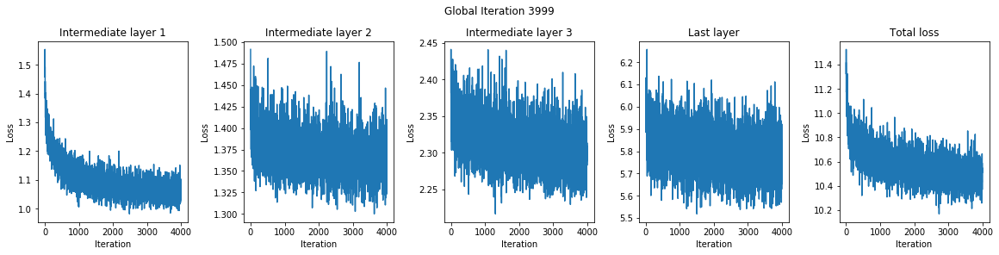

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


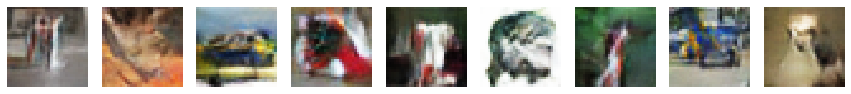

Reconstructed images:


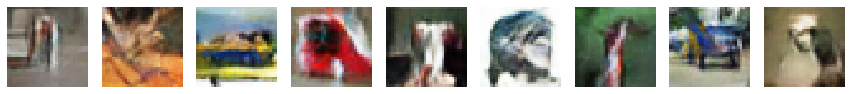

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


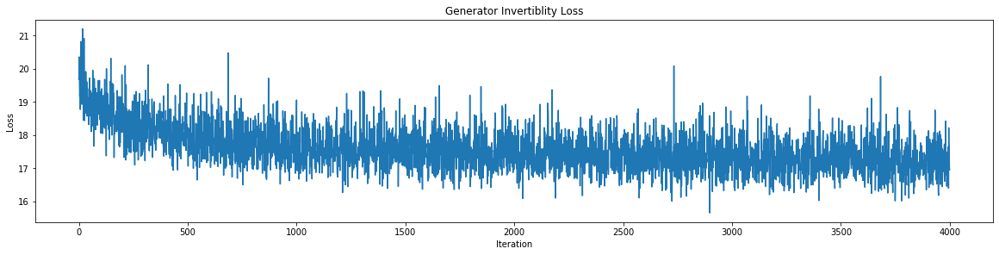

Real images:


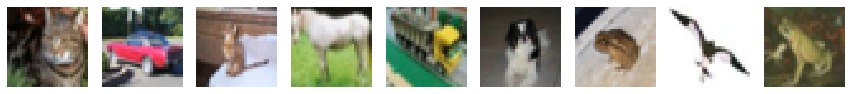

Reconstructed images:


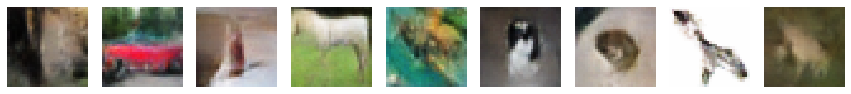

Reconstructed images after training:


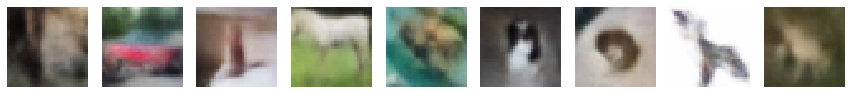

iter 3999	train disc cost	-2.559454917907715	time	0.15655000000000002	inception score	5.8614020347595215	dev disc cost	-1.3389999866485596
iter 4099	train disc cost	-3.062664747238159	time	0.15635200000000002	dev disc cost	-1.2660000324249268
iter 4199	train disc cost	-2.6191210746765137	time	0.157215	dev disc cost	-1.1684999465942383
iter 4299	train disc cost	-2.5669591426849365	time	0.157384	dev disc cost	-1.0537999868392944
iter 4399	train disc cost	-2.5846571922302246	time	0.15677500000000003	dev disc cost	-1.1051000356674194
iter 4499	train disc cost	-2.5211238861083984	time	0.157089	dev disc cost	-1.0728000402450562
iter 4599	train disc cost	-2.530100107192993	time	0.15661	dev disc cost	-1.126099944114685
iter 4699	train disc cost	-2.5260870456695557	time	0.15734700000000001	dev disc cost	-1.1354999542236328
iter 4799	train disc cost	-2.488257884979248	time	0.157319	dev disc cost	-1.096500039100647
iter 4899	train disc cost	-2.509211301803589	time	0.15658	dev disc cost	-0.9975000

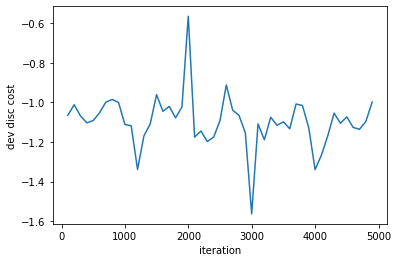

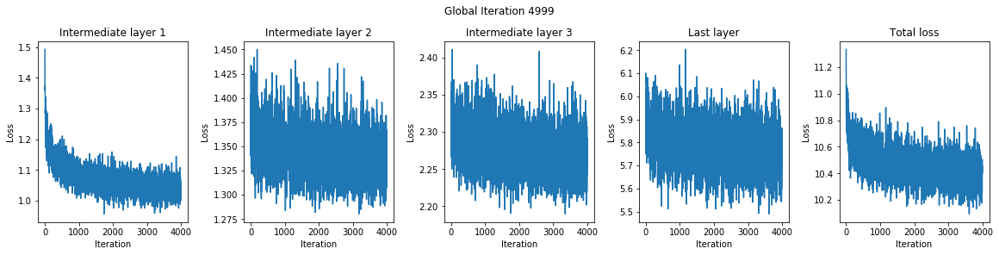

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


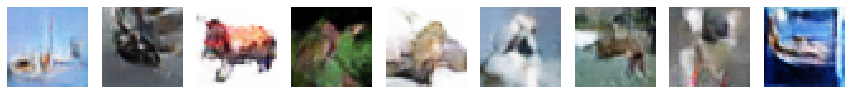

Reconstructed images:


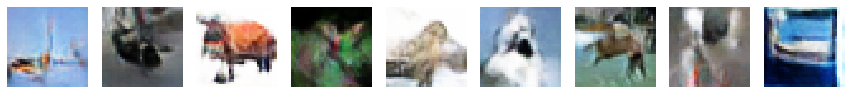

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


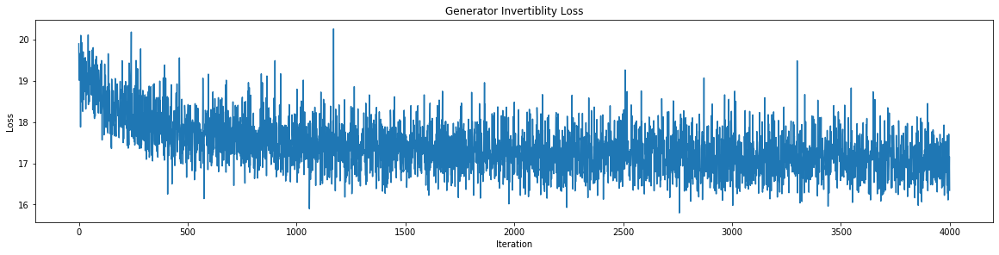

Real images:


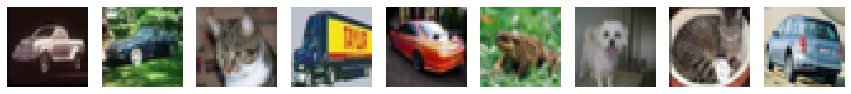

Reconstructed images:


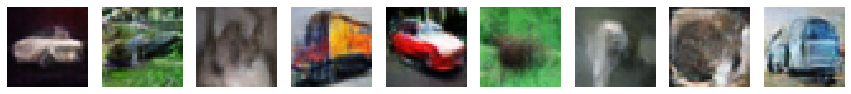

Reconstructed images after training:


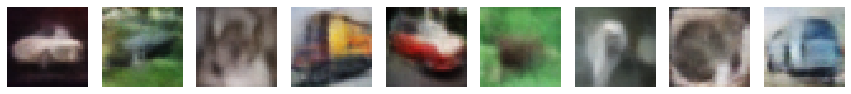

iter 4999	train disc cost	-2.572273015975952	time	0.15731299999999998	inception score	5.761094093322754	dev disc cost	-1.2382999658584595
iter 5099	train disc cost	-3.018887996673584	time	0.157095	dev disc cost	-1.3798999786376953
iter 5199	train disc cost	-2.60417103767395	time	0.15648	dev disc cost	-1.264799952507019
iter 5299	train disc cost	-2.544495105743408	time	0.15736	dev disc cost	-1.17330002784729
iter 5399	train disc cost	-2.5738110542297363	time	0.157364	dev disc cost	-1.098099946975708
iter 5499	train disc cost	-2.5490760803222656	time	0.156469	dev disc cost	-1.0242999792099
iter 5599	train disc cost	-2.569448947906494	time	0.15737	dev disc cost	-1.044100046157837
iter 5699	train disc cost	-2.502277135848999	time	0.157229	dev disc cost	-1.1018999814987183
iter 5799	train disc cost	-2.487217664718628	time	0.15653	dev disc cost	-0.9333000183105469
iter 5899	train disc cost	-2.530061960220337	time	0.156801	dev disc cost	-1.0161999464035034
=========inception score========
Sav

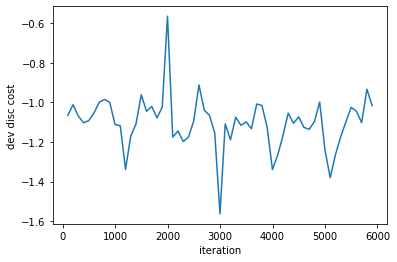

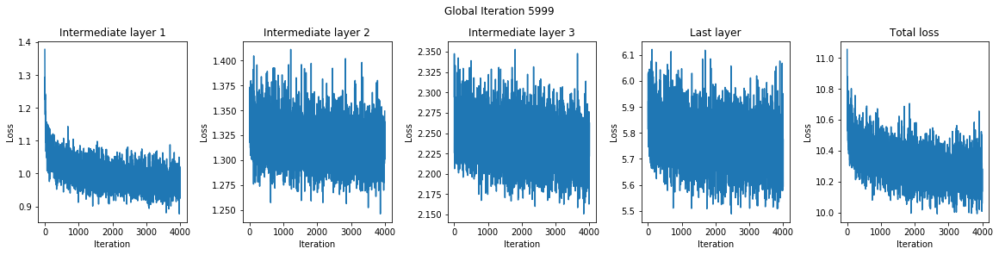

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


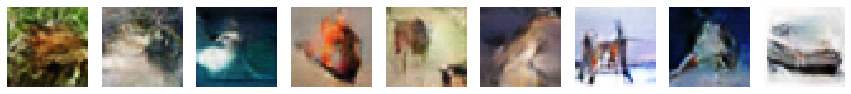

Reconstructed images:


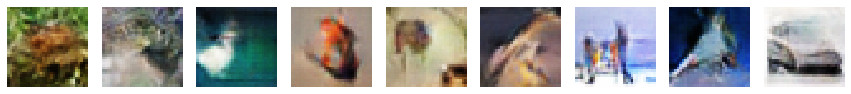

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
iter 6099	train disc cost	-2.9847910404205322	time	0.156384	dev disc cost	-1.1226999759674072
iter 6199	train disc cost	-2.653597116470337	time	0.157389	dev disc cost	-1.105299949645996
iter 6299	train disc cost	-2.6182680130004883	time	0.15729	dev disc cost	-1.0735000371932983
iter 6399	train disc cost	-2.5736520290374756	time	0.15663100000000002	dev disc cost	-1.1202000379562378
iter 6499	train disc cost	-2.57338809967041	time	0.15714599999999998	dev disc cost	-0.975600004196167
iter 6599	train disc cost	-2.5711820125579834	time	0.15655799999999997	dev disc cost	-1.059999942779541
iter 6699	train disc cost	-2.5374510288238525	time	0.15721300000000002	dev disc cost	-1.007699966430664
iter 6799	train disc cost	-2.539933919906616	time	0.157235	dev

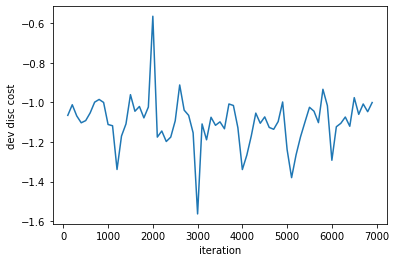

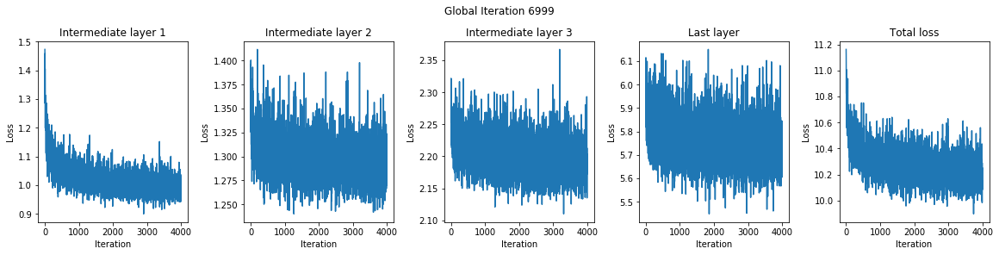

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


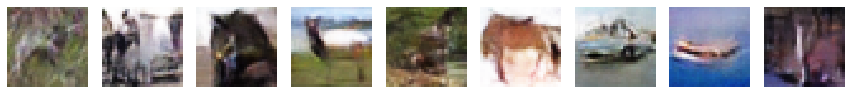

Reconstructed images:


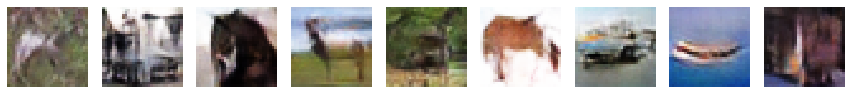

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


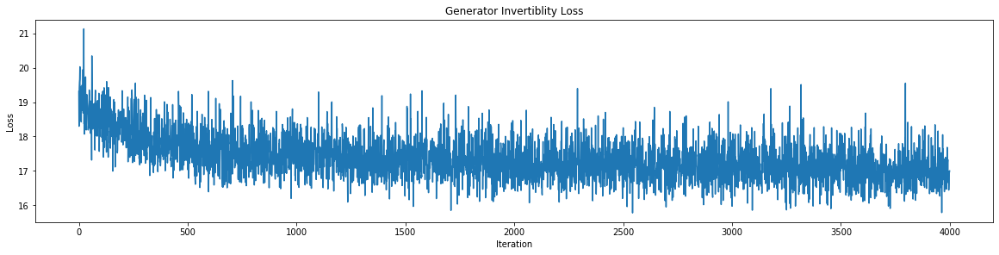

Real images:


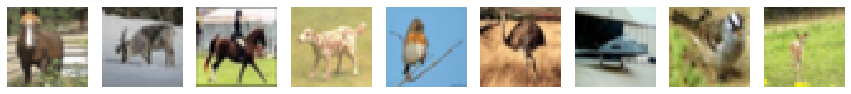

Reconstructed images:


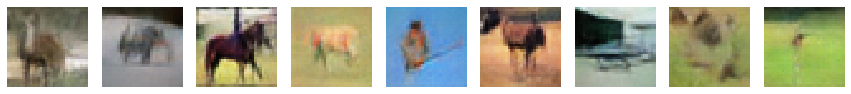

Reconstructed images after training:


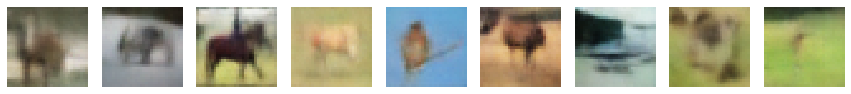

iter 6999	train disc cost	-2.5664665699005127	time	0.15752300000000002	inception score	5.649856090545654	dev disc cost	-1.5836000442504883
iter 7099	train disc cost	-2.971778631210327	time	0.157153	dev disc cost	-1.2865999937057495
iter 7199	train disc cost	-2.6252570152282715	time	0.156485	dev disc cost	-1.1819000244140625
iter 7299	train disc cost	-2.526386022567749	time	0.15720599999999998	dev disc cost	-1.0331000089645386
iter 7399	train disc cost	-2.5405359268188477	time	0.15704999999999997	dev disc cost	-1.0240000486373901
iter 7499	train disc cost	-2.5834732055664062	time	0.15651	dev disc cost	-1.0614999532699585
iter 7599	train disc cost	-2.5401220321655273	time	0.157147	dev disc cost	-1.0947999954223633
iter 7699	train disc cost	-2.5166702270507812	time	0.157353	dev disc cost	-1.0405999422073364
iter 7799	train disc cost	-2.565593957901001	time	0.15649800000000003	dev disc cost	-1.0932999849319458
iter 7899	train disc cost	-2.5830838680267334	time	0.157113	dev disc cost	-1.151

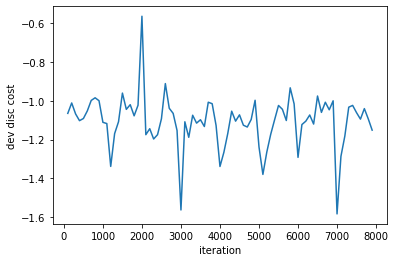

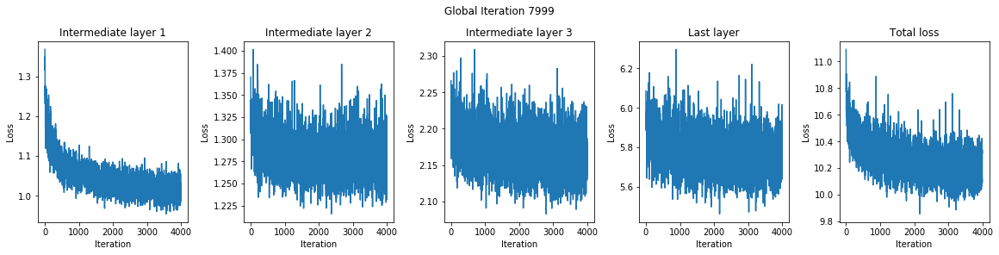

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


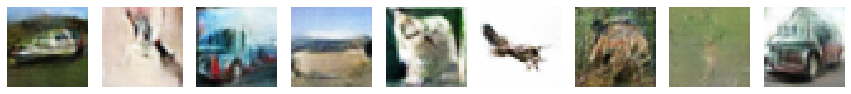

Reconstructed images:


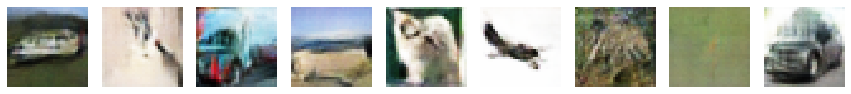

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


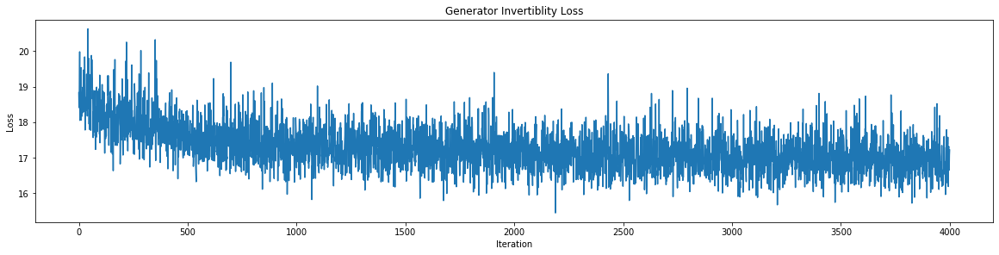

Real images:


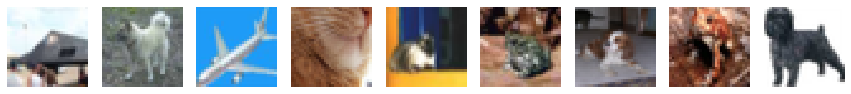

Reconstructed images:


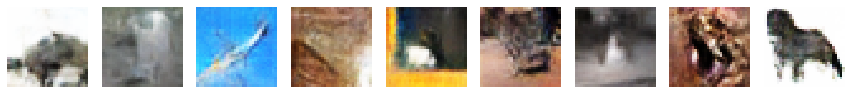

Reconstructed images after training:


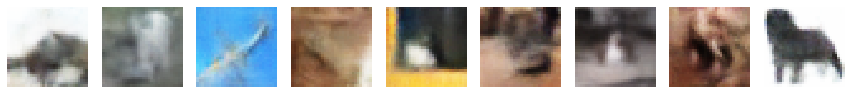

iter 7999	train disc cost	-2.5484349727630615	time	0.157443	inception score	5.659672737121582	dev disc cost	-1.198199987411499
iter 8099	train disc cost	-2.969871759414673	time	0.15577300000000002	dev disc cost	-1.2554999589920044
iter 8199	train disc cost	-2.6423091888427734	time	0.15671100000000002	dev disc cost	-1.1195000410079956
iter 8299	train disc cost	-2.604294776916504	time	0.15666999999999998	dev disc cost	-1.1243000030517578
iter 8399	train disc cost	-2.564959764480591	time	0.15597200000000003	dev disc cost	-1.0573999881744385
iter 8499	train disc cost	-2.5923378467559814	time	0.15675	dev disc cost	-0.9140999913215637
iter 8599	train disc cost	-2.5473620891571045	time	0.156682	dev disc cost	-1.0906000137329102
iter 8699	train disc cost	-2.5596189498901367	time	0.155993	dev disc cost	-1.0354000329971313
iter 8799	train disc cost	-2.59633207321167	time	0.156987	dev disc cost	-1.000100016593933
iter 8899	train disc cost	-2.4965929985046387	time	0.15580999999999998	dev disc cost

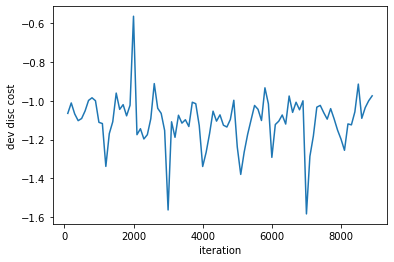

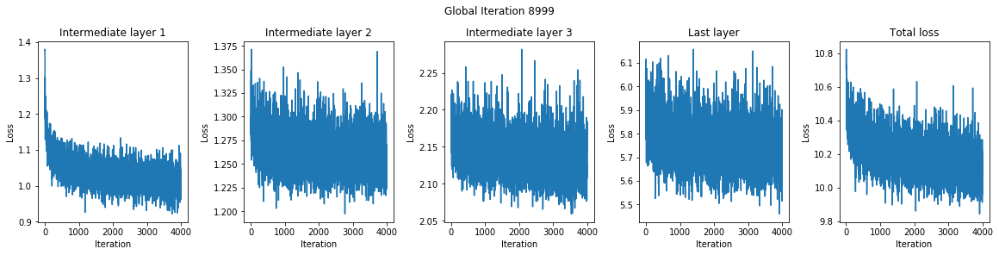

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


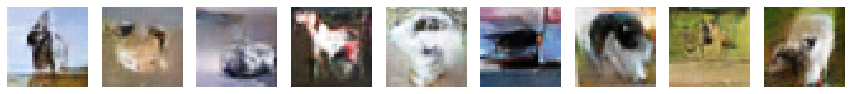

Reconstructed images:


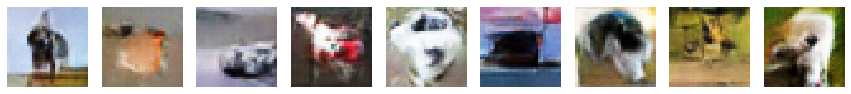

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


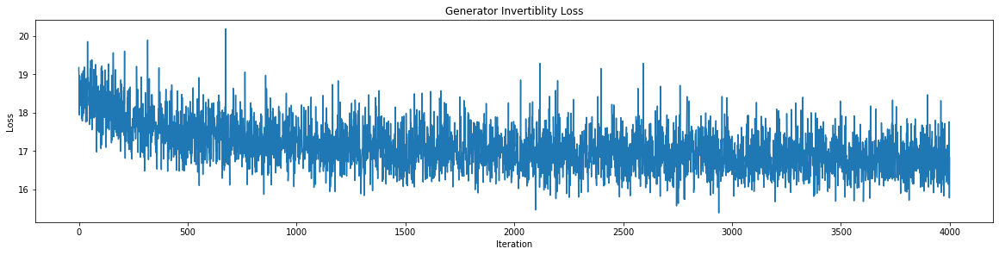

Real images:


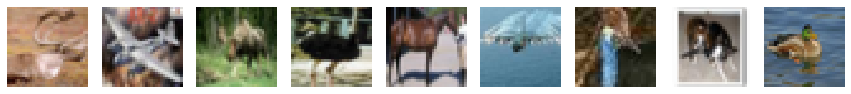

Reconstructed images:


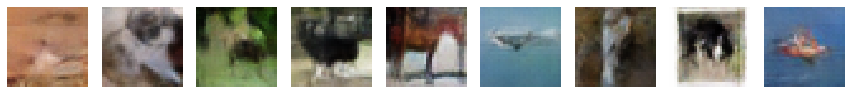

Reconstructed images after training:


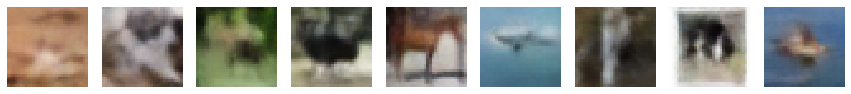

iter 8999	train disc cost	-2.5717599391937256	time	0.15684900000000002	inception score	5.931048393249512	dev disc cost	-0.6636000275611877
iter 9099	train disc cost	-2.990802049636841	time	0.157247	dev disc cost	-1.205899953842163
iter 9199	train disc cost	-2.601937770843506	time	0.15741499999999997	dev disc cost	-1.1103999614715576
iter 9299	train disc cost	-2.63942289352417	time	0.156339	dev disc cost	-1.0722999572753906
iter 9399	train disc cost	-2.5542640686035156	time	0.157533	dev disc cost	-1.0534000396728516
iter 9499	train disc cost	-2.5852508544921875	time	0.156568	dev disc cost	-0.9571999907493591
iter 9599	train disc cost	-2.577366828918457	time	0.156997	dev disc cost	-0.9897000193595886
iter 9699	train disc cost	-2.5837719440460205	time	0.15725499999999998	dev disc cost	-0.9435999989509583
iter 9799	train disc cost	-2.507575035095215	time	0.15637600000000001	dev disc cost	-0.9994000196456909
iter 9899	train disc cost	-2.6073250770568848	time	0.15739799999999998	dev disc cos

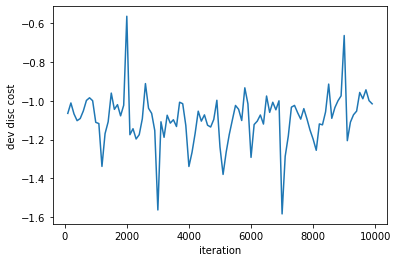

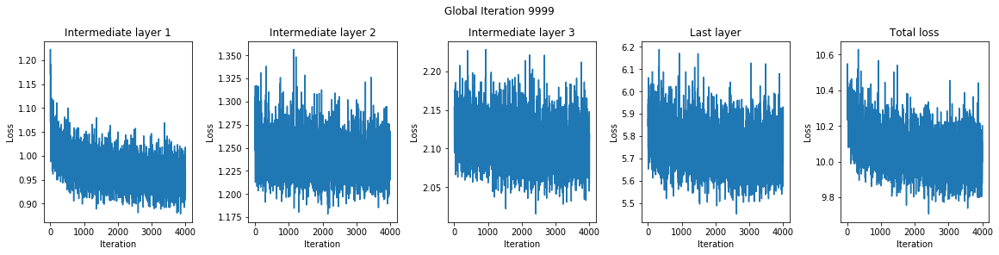

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


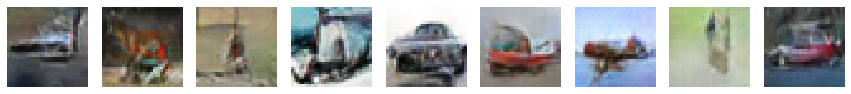

Reconstructed images:


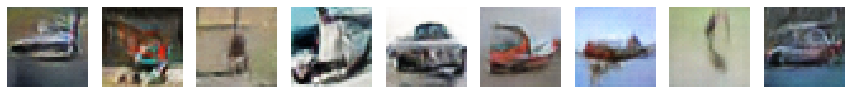

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


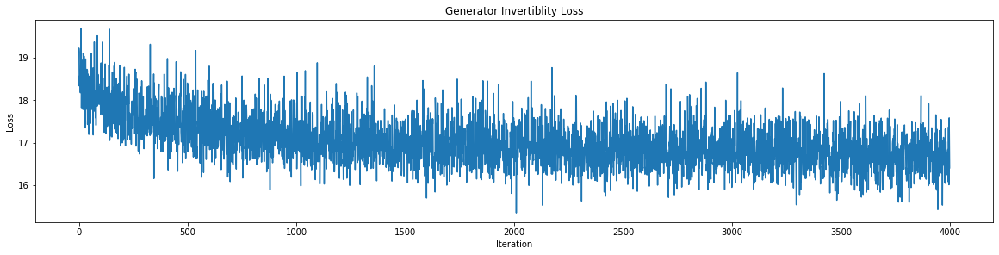

Real images:


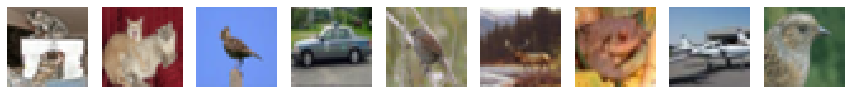

Reconstructed images:


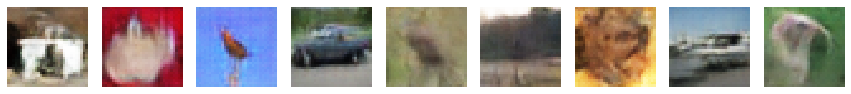

Reconstructed images after training:


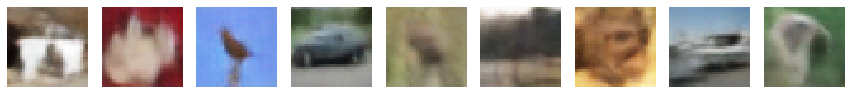

iter 9999	train disc cost	-2.5015549659729004	time	0.157085	inception score	5.777224063873291	dev disc cost	-1.1990000009536743
iter 10099	train disc cost	-3.0263776779174805	time	0.15591999999999998	dev disc cost	-1.159600019454956
iter 10199	train disc cost	-2.6007871627807617	time	0.15660800000000002	dev disc cost	-1.0643999576568604
iter 10299	train disc cost	-2.617598295211792	time	0.156992	dev disc cost	-1.0161999464035034
iter 10399	train disc cost	-2.591916084289551	time	0.156066	dev disc cost	-1.1096999645233154
iter 10499	train disc cost	-2.583559036254883	time	0.156905	dev disc cost	-1.0389000177383423
iter 10599	train disc cost	-2.5405616760253906	time	0.15684599999999999	dev disc cost	-1.1514999866485596
iter 10699	train disc cost	-2.5881502628326416	time	0.156003	dev disc cost	-0.9908999800682068
iter 10799	train disc cost	-2.52632999420166	time	0.15687000000000004	dev disc cost	-1.0434999465942383
iter 10899	train disc cost	-2.560835838317871	time	0.156578	dev disc cost	

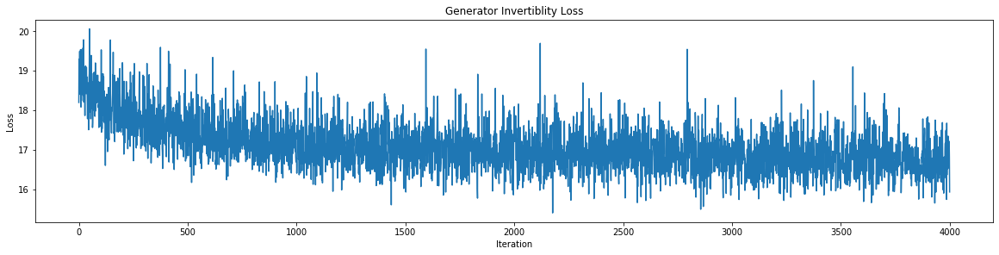

Real images:


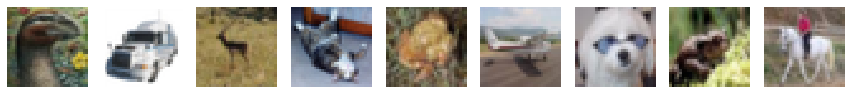

Reconstructed images:


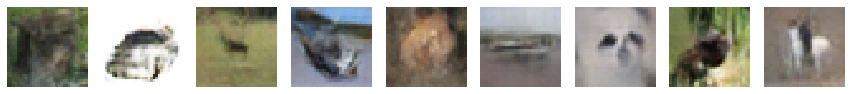

Reconstructed images after training:


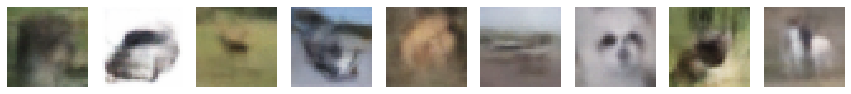

iter 10999	train disc cost	-2.5570380687713623	time	0.156244	inception score	5.745065212249756	dev disc cost	-0.6812000274658203
iter 11099	train disc cost	-3.048464059829712	time	0.15640500000000002	dev disc cost	-1.2508000135421753
iter 11199	train disc cost	-2.596024990081787	time	0.15690199999999999	dev disc cost	-1.1065000295639038
iter 11299	train disc cost	-2.6453447341918945	time	0.15589499999999998	dev disc cost	-1.0795999765396118
iter 11399	train disc cost	-2.5581061840057373	time	0.15665699999999996	dev disc cost	-1.1105999946594238
iter 11499	train disc cost	-2.5956592559814453	time	0.156031	dev disc cost	-0.9842000007629395
iter 11599	train disc cost	-2.639223098754883	time	0.156853	dev disc cost	-1.0147000551223755
iter 11699	train disc cost	-2.592034101486206	time	0.15697399999999997	dev disc cost	-1.0461000204086304
iter 11799	train disc cost	-2.545562982559204	time	0.15612399999999999	dev disc cost	-0.992900013923645
iter 11899	train disc cost	-2.5740468502044678	time

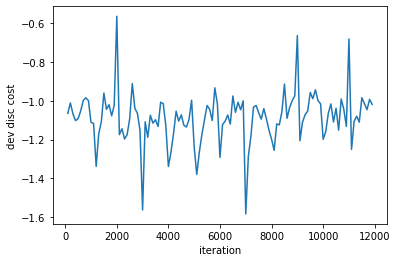

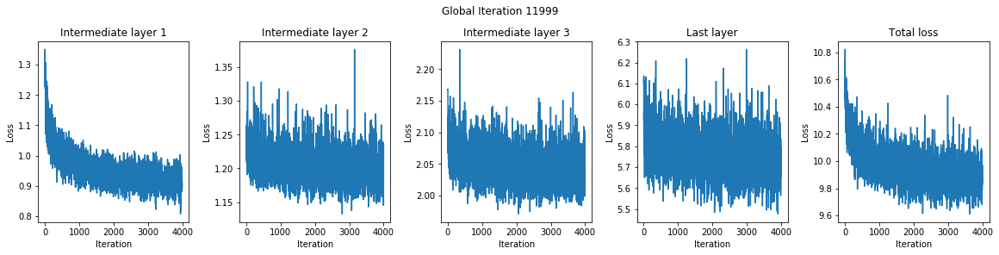

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


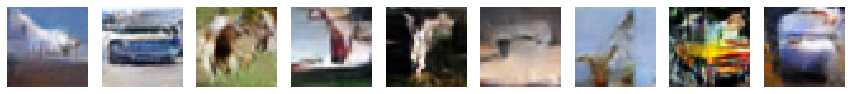

Reconstructed images:


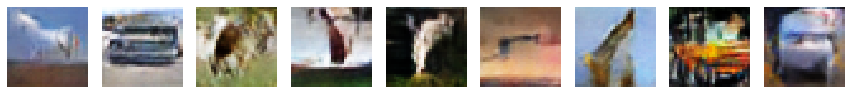

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


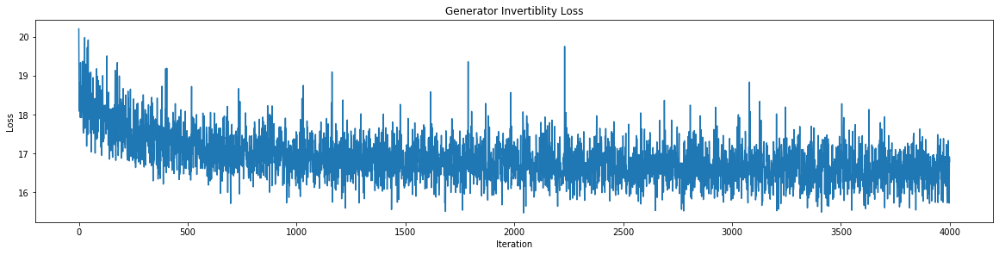

Real images:


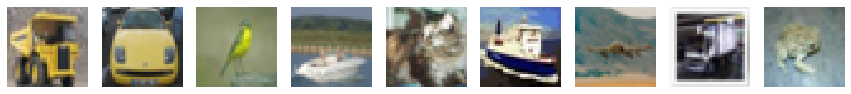

Reconstructed images:


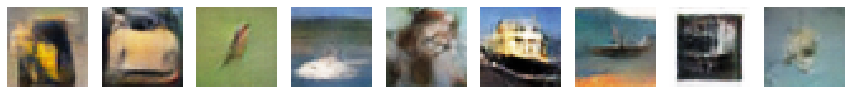

Reconstructed images after training:


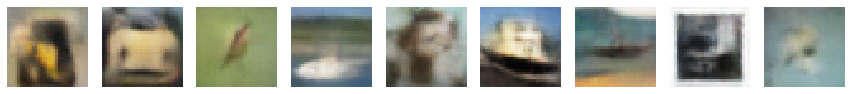

iter 11999	train disc cost	-2.5663528442382812	time	0.15664299999999998	inception score	5.68041467666626	dev disc cost	-0.5846999883651733
iter 12099	train disc cost	-2.999267578125	time	0.15584199999999998	dev disc cost	-1.2525999546051025
iter 12199	train disc cost	-2.6751108169555664	time	0.15643200000000002	dev disc cost	-1.0155999660491943
iter 12299	train disc cost	-2.6134252548217773	time	0.15675699999999998	dev disc cost	-0.9919999837875366
iter 12399	train disc cost	-2.569342851638794	time	0.15601900000000002	dev disc cost	-1.0973000526428223
iter 12499	train disc cost	-2.616921901702881	time	0.156867	dev disc cost	-1.0437999963760376
iter 12599	train disc cost	-2.6246025562286377	time	0.156734	dev disc cost	-1.017300009727478
iter 12699	train disc cost	-2.6324210166931152	time	0.155933	dev disc cost	-1.0566999912261963
iter 12799	train disc cost	-2.522265911102295	time	0.156738	dev disc cost	-0.9502000212669373
iter 12899	train disc cost	-2.5822198390960693	time	0.15681200000

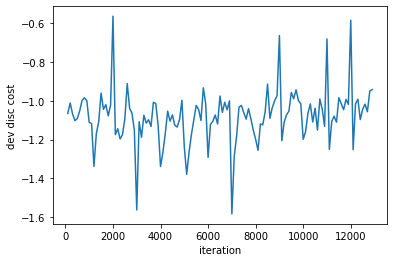

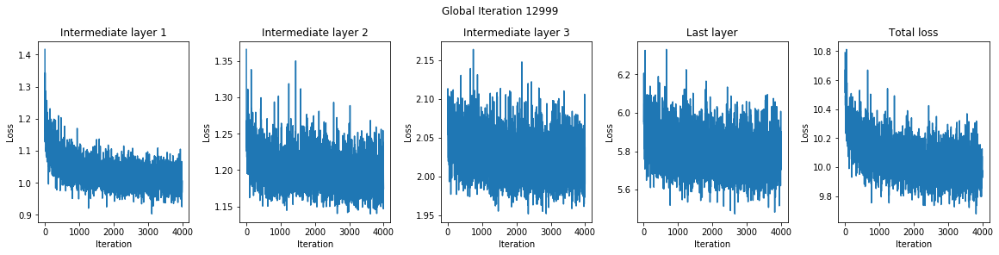

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


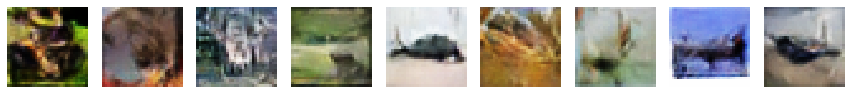

Reconstructed images:


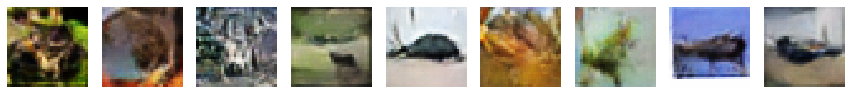

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


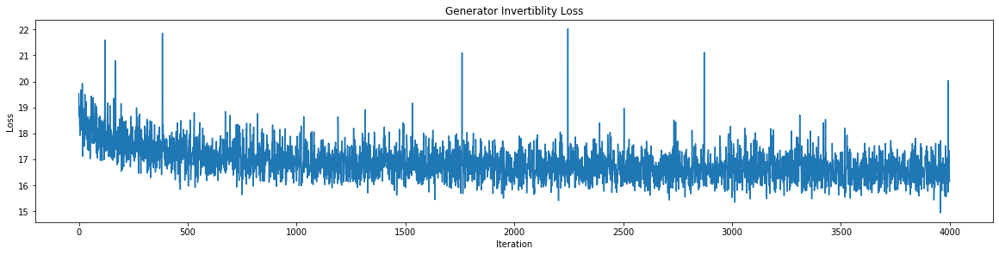

Real images:


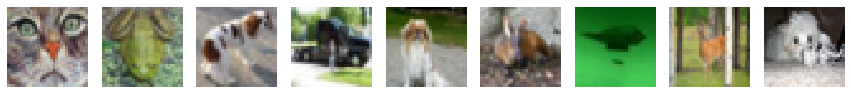

Reconstructed images:


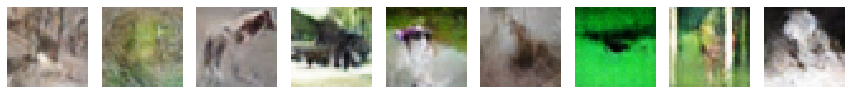

Reconstructed images after training:


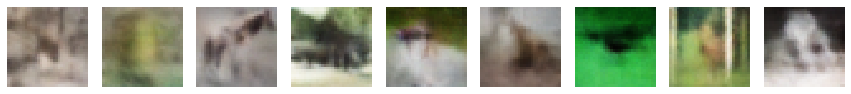

iter 12999	train disc cost	-2.5488648414611816	time	0.15599999999999997	inception score	5.85231876373291	dev disc cost	-0.970300018787384
iter 13099	train disc cost	-3.085360050201416	time	0.156517	dev disc cost	-1.225100040435791
iter 13199	train disc cost	-2.64802622795105	time	0.156617	dev disc cost	-0.9370999932289124
iter 13299	train disc cost	-2.5954172611236572	time	0.155994	dev disc cost	-1.1371999979019165
iter 13399	train disc cost	-2.6289751529693604	time	0.15671599999999997	dev disc cost	-1.030500054359436
iter 13499	train disc cost	-2.5732107162475586	time	0.156798	dev disc cost	-1.0592000484466553
iter 13599	train disc cost	-2.6155190467834473	time	0.155988	dev disc cost	-1.030900001525879
iter 13699	train disc cost	-2.5875744819641113	time	0.15651899999999996	dev disc cost	-1.0865000486373901
iter 13799	train disc cost	-2.587292194366455	time	0.155911	dev disc cost	-0.992900013923645
iter 13899	train disc cost	-2.551232099533081	time	0.156605	dev disc cost	-0.99830001592

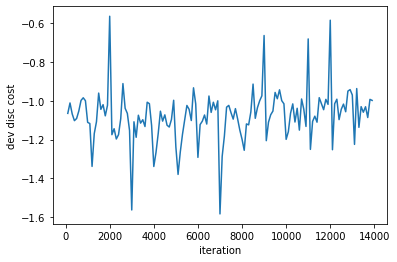

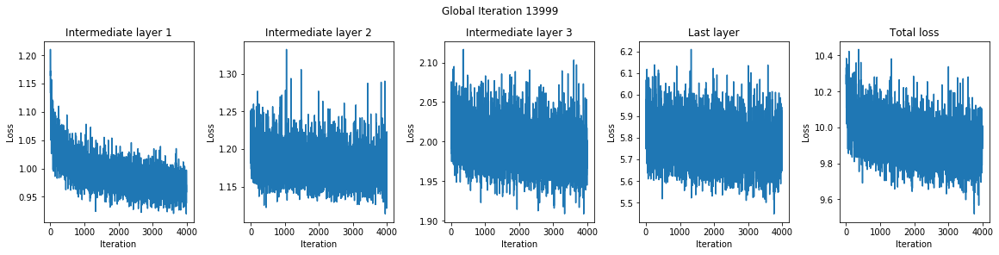

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


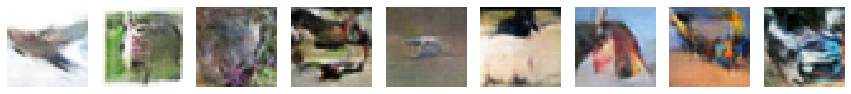

Reconstructed images:


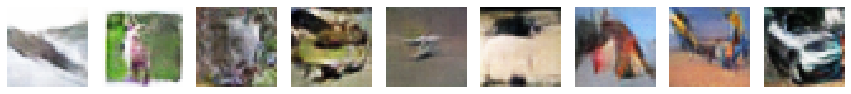

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


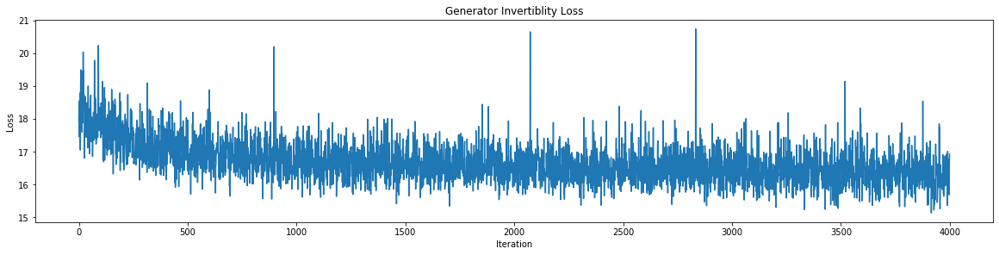

Real images:


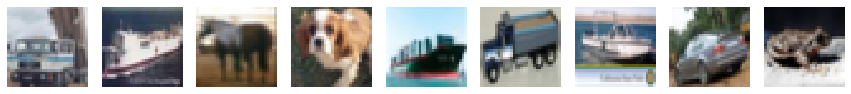

Reconstructed images:


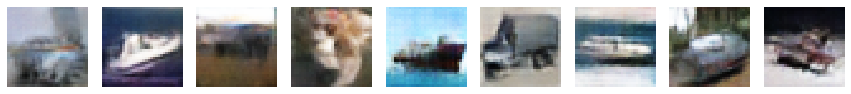

Reconstructed images after training:


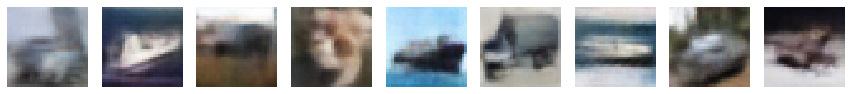

iter 13999	train disc cost	-2.5709688663482666	time	0.15672	inception score	5.682682991027832	dev disc cost	-0.6205000281333923
iter 14099	train disc cost	-2.983649969100952	time	0.155887	dev disc cost	-1.0267000198364258
iter 14199	train disc cost	-2.644167184829712	time	0.156669	dev disc cost	-1.0748000144958496
iter 14299	train disc cost	-2.5859742164611816	time	0.15680300000000003	dev disc cost	-0.977400004863739
iter 14399	train disc cost	-2.5692081451416016	time	0.155989	dev disc cost	-0.9728000164031982
iter 14499	train disc cost	-2.5644421577453613	time	0.15653999999999998	dev disc cost	-1.0391000509262085
iter 14599	train disc cost	-2.5929694175720215	time	0.156438	dev disc cost	-1.0527000427246094
iter 14699	train disc cost	-2.576977014541626	time	0.155753	dev disc cost	-1.127500057220459
iter 14799	train disc cost	-2.6168179512023926	time	0.156657	dev disc cost	-0.9476000070571899
iter 14899	train disc cost	-2.5734920501708984	time	0.15668700000000002	dev disc cost	-0.959800

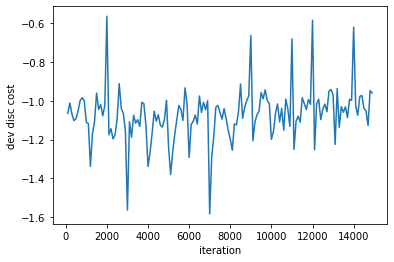

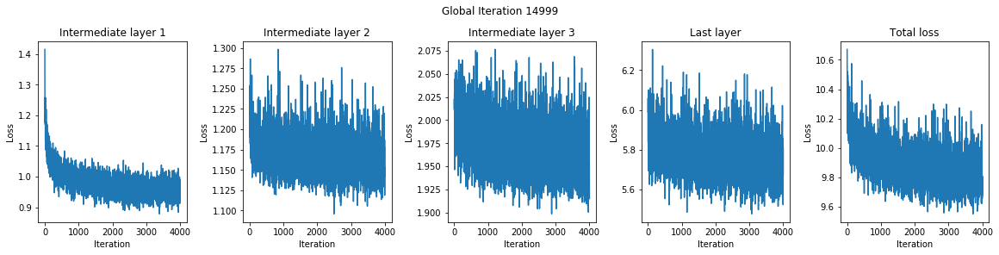

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


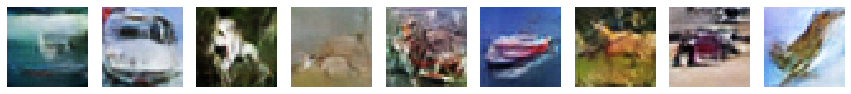

Reconstructed images:


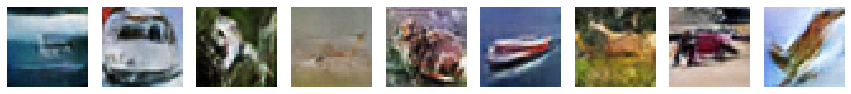

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


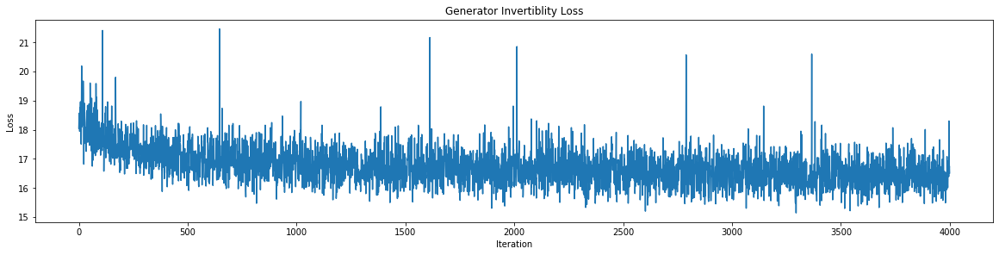

Real images:


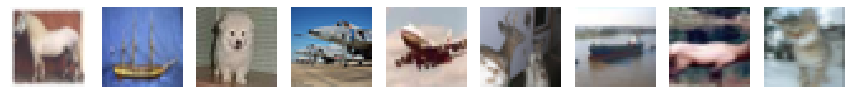

Reconstructed images:


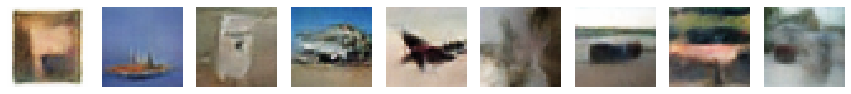

Reconstructed images after training:


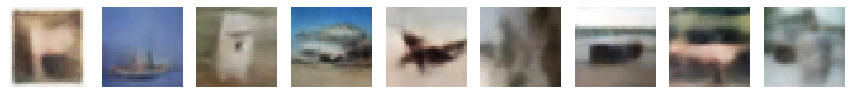

iter 14999	train disc cost	-2.5641677379608154	time	0.155663	inception score	5.593500137329102	dev disc cost	-0.7350000143051147
iter 15099	train disc cost	-3.044262170791626	time	0.157196	dev disc cost	-1.2303999662399292
iter 15199	train disc cost	-2.602445125579834	time	0.15721100000000002	dev disc cost	-1.1786999702453613
iter 15299	train disc cost	-2.6055068969726562	time	0.15641300000000002	dev disc cost	-1.0915000438690186
iter 15399	train disc cost	-2.602846622467041	time	0.156685	dev disc cost	-1.037500023841858
iter 15499	train disc cost	-2.5900468826293945	time	0.156793	dev disc cost	-1.0392999649047852
iter 15599	train disc cost	-2.6570160388946533	time	0.156006	dev disc cost	-0.9190999865531921
iter 15699	train disc cost	-2.5895678997039795	time	0.156758	dev disc cost	-1.0133999586105347
iter 15799	train disc cost	-2.5917248725891113	time	0.156061	dev disc cost	-1.06850004196167
iter 15899	train disc cost	-2.587398052215576	time	0.15702699999999997	dev disc cost	-0.9470000

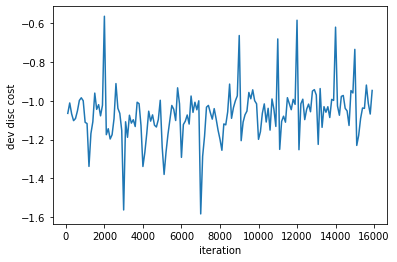

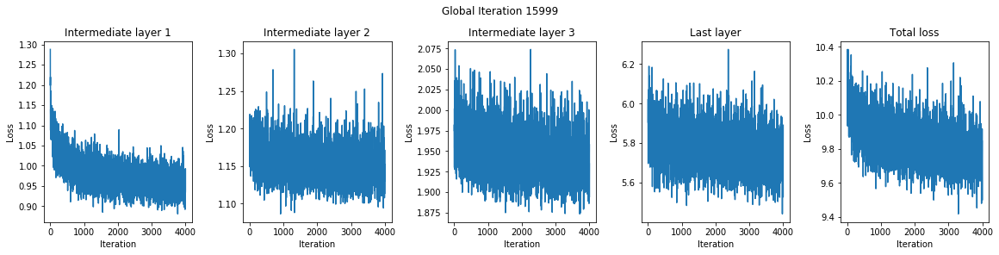

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


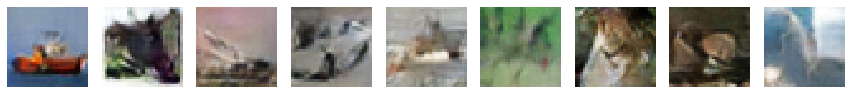

Reconstructed images:


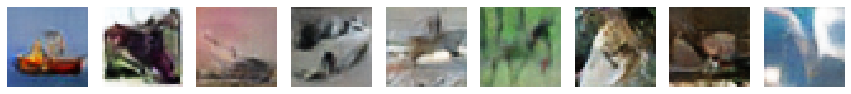

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


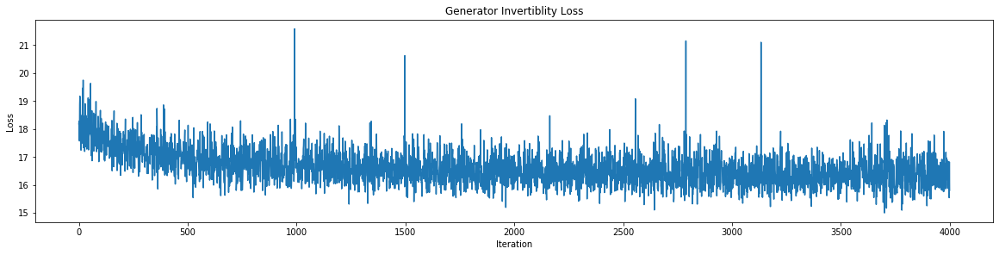

Real images:


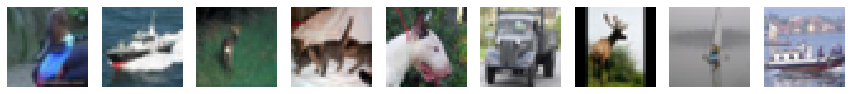

Reconstructed images:


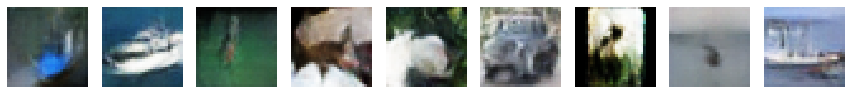

Reconstructed images after training:


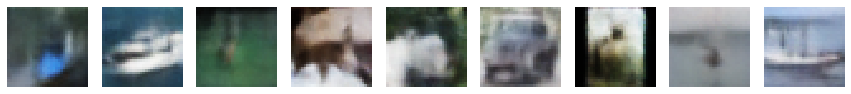

iter 15999	train disc cost	-2.6301333904266357	time	0.15665600000000002	inception score	5.800572395324707	dev disc cost	-1.4909000396728516
iter 16099	train disc cost	-2.9835281372070312	time	0.157339	dev disc cost	-1.1131000518798828
iter 16199	train disc cost	-2.6331369876861572	time	0.15632900000000002	dev disc cost	-1.0111000537872314
iter 16299	train disc cost	-2.600501775741577	time	0.157156	dev disc cost	-1.1043000221252441
iter 16399	train disc cost	-2.6180810928344727	time	0.15655600000000003	dev disc cost	-0.968500018119812
iter 16499	train disc cost	-2.602640151977539	time	0.157454	dev disc cost	-1.0973999500274658
iter 16599	train disc cost	-2.5876739025115967	time	0.157136	dev disc cost	-1.1102999448776245
iter 16699	train disc cost	-2.6227972507476807	time	0.156415	dev disc cost	-0.8812000155448914
iter 16799	train disc cost	-2.588092088699341	time	0.15718600000000002	dev disc cost	-0.9296000003814697
iter 16899	train disc cost	-2.575435161590576	time	0.15709199999999998	

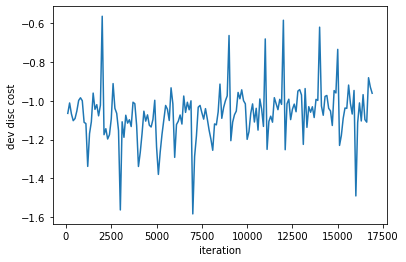

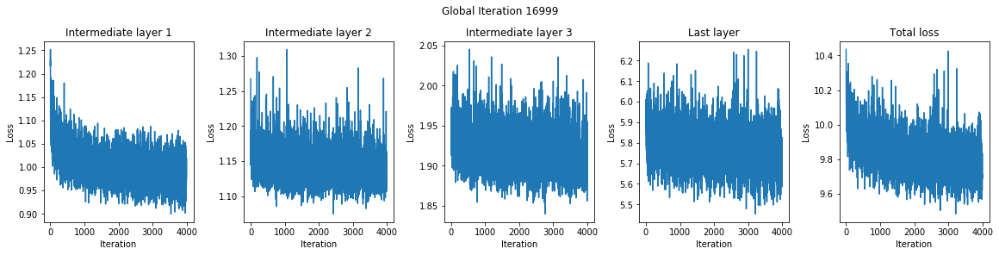

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


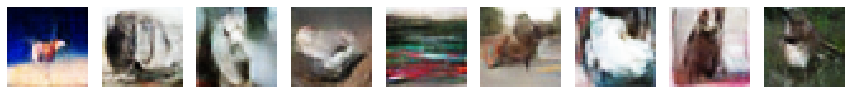

Reconstructed images:


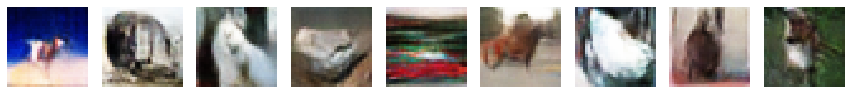

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


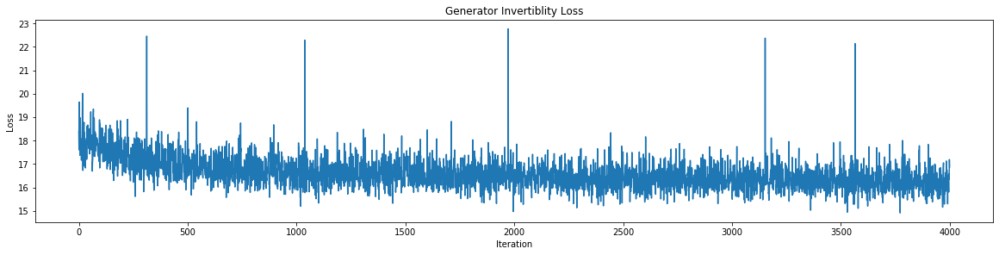

Real images:


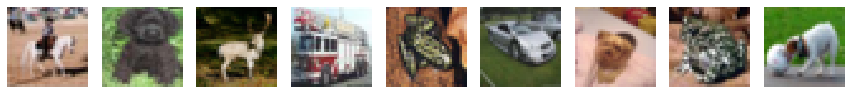

Reconstructed images:


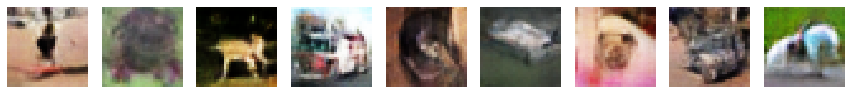

Reconstructed images after training:


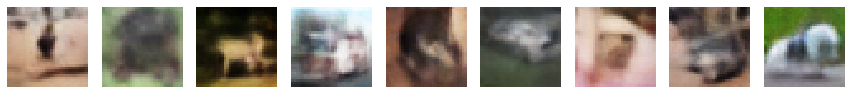

iter 16999	train disc cost	-2.5795068740844727	time	0.15659099999999998	inception score	5.785547733306885	dev disc cost	-0.8447999954223633
iter 17099	train disc cost	-3.0708563327789307	time	0.15685899999999997	dev disc cost	-1.1344000101089478
iter 17199	train disc cost	-2.6389596462249756	time	0.15726600000000002	dev disc cost	-1.1450999975204468
iter 17299	train disc cost	-2.684983491897583	time	0.156379	dev disc cost	-1.0432000160217285
iter 17399	train disc cost	-2.6307027339935303	time	0.157254	dev disc cost	-0.9434999823570251
iter 17499	train disc cost	-2.627272129058838	time	0.157394	dev disc cost	-0.9970999956130981
iter 17599	train disc cost	-2.6138689517974854	time	0.156163	dev disc cost	-0.9498000144958496
iter 17699	train disc cost	-2.6093978881835938	time	0.15735599999999997	dev disc cost	-1.0283000469207764
iter 17799	train disc cost	-2.600691318511963	time	0.157065	dev disc cost	-1.0468000173568726
iter 17899	train disc cost	-2.6004788875579834	time	0.15639	dev disc c

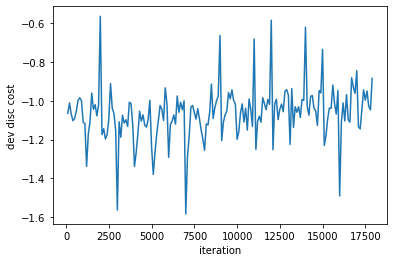

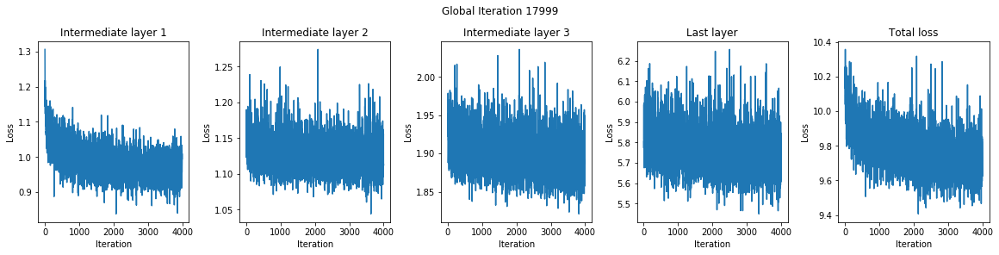

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


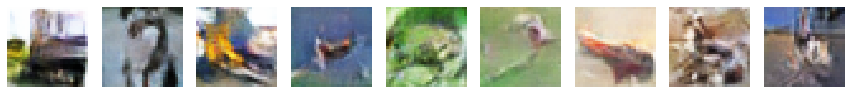

Reconstructed images:


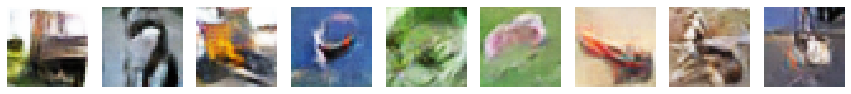

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


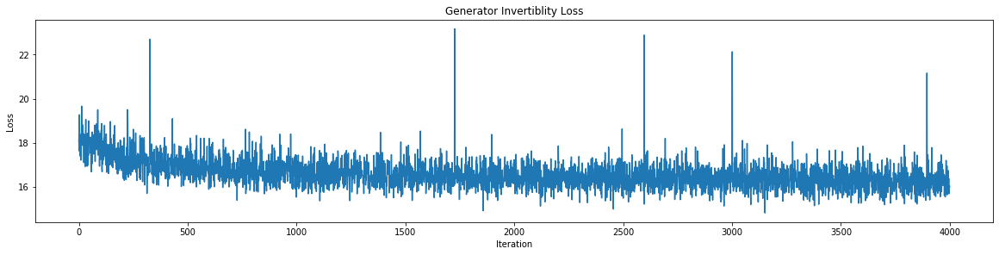

Real images:


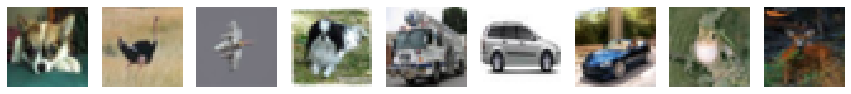

Reconstructed images:


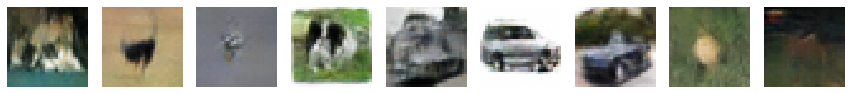

Reconstructed images after training:


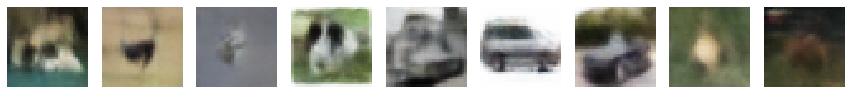

iter 17999	train disc cost	-2.6001369953155518	time	0.157211	inception score	5.611865997314453	dev disc cost	-1.1819000244140625
iter 18099	train disc cost	-3.0488779544830322	time	0.15710000000000002	dev disc cost	-1.1481000185012817
iter 18199	train disc cost	-2.666064739227295	time	0.15649699999999997	dev disc cost	-1.0867999792099
iter 18299	train disc cost	-2.6524670124053955	time	0.15717799999999996	dev disc cost	-1.0786999464035034
iter 18399	train disc cost	-2.6261489391326904	time	0.157331	dev disc cost	-1.0085999965667725
iter 18499	train disc cost	-2.639406681060791	time	0.15672399999999997	dev disc cost	-0.9426000118255615
iter 18599	train disc cost	-2.6791298389434814	time	0.157168	dev disc cost	-1.0299999713897705
iter 18699	train disc cost	-2.5761308670043945	time	0.15599099999999996	dev disc cost	-0.9926999807357788
iter 18799	train disc cost	-2.630007028579712	time	0.15673	dev disc cost	-0.9707000255584717
iter 18899	train disc cost	-2.5593018531799316	time	0.156955999

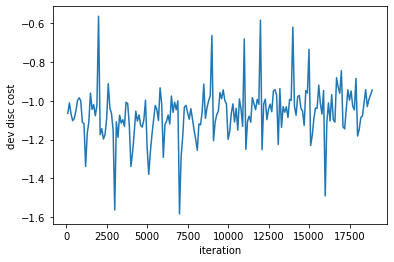

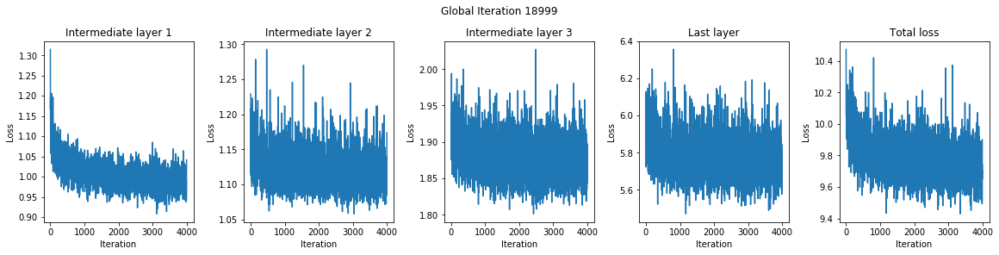

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


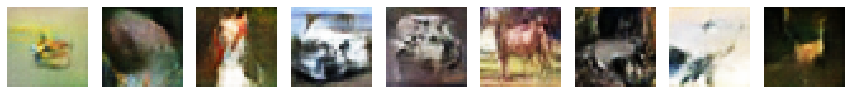

Reconstructed images:


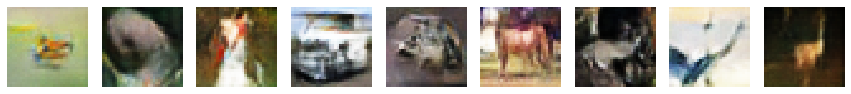

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


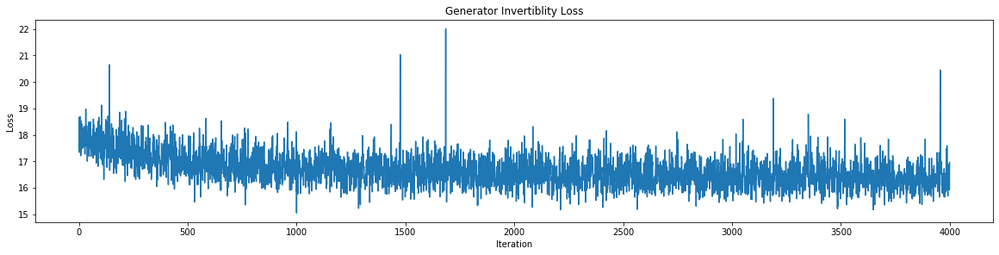

Real images:


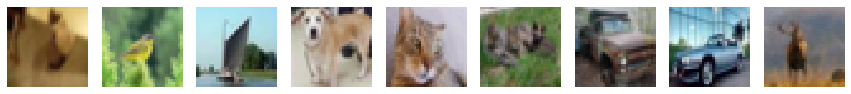

Reconstructed images:


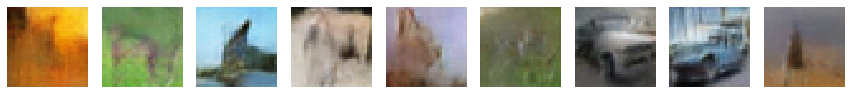

Reconstructed images after training:


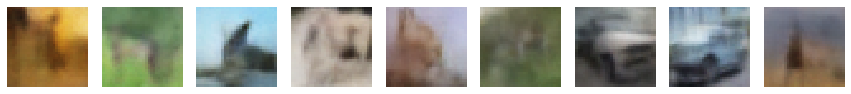

iter 18999	train disc cost	-2.586940288543701	time	0.15608900000000003	inception score	5.568808555603027	dev disc cost	-0.5985999703407288
iter 19099	train disc cost	-3.0154831409454346	time	0.156463	dev disc cost	-1.2371000051498413
iter 19199	train disc cost	-2.703458547592163	time	0.15664499999999998	dev disc cost	-1.0017000436782837
iter 19299	train disc cost	-2.706343173980713	time	0.15587199999999998	dev disc cost	-1.1030000448226929
iter 19399	train disc cost	-2.6253621578216553	time	0.156721	dev disc cost	-1.041200041770935
iter 19499	train disc cost	-2.594906806945801	time	0.15673700000000002	dev disc cost	-1.0144000053405762
iter 19599	train disc cost	-2.570570945739746	time	0.155704	dev disc cost	-1.0205999612808228
iter 19699	train disc cost	-2.596252679824829	time	0.156741	dev disc cost	-1.0216000080108643
iter 19799	train disc cost	-2.624497890472412	time	0.156742	dev disc cost	-0.9776999950408936
iter 19899	train disc cost	-2.5809829235076904	time	0.15580100000000002	dev

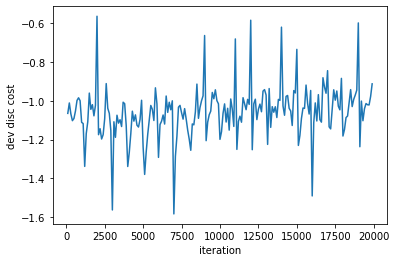

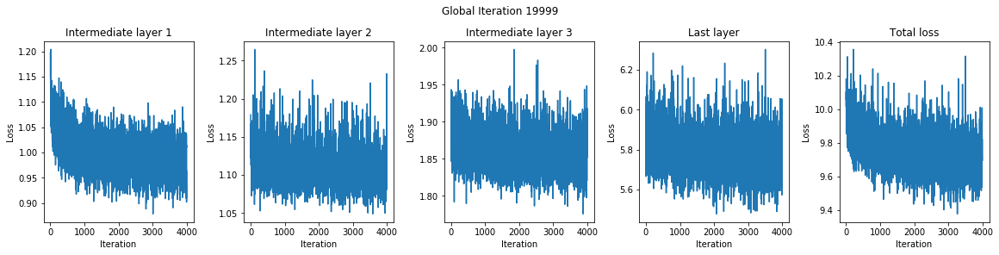

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


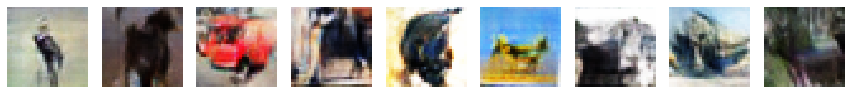

Reconstructed images:


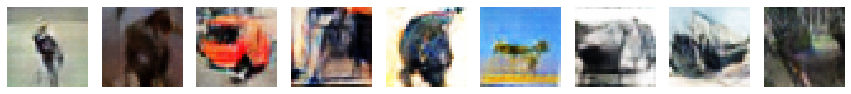

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


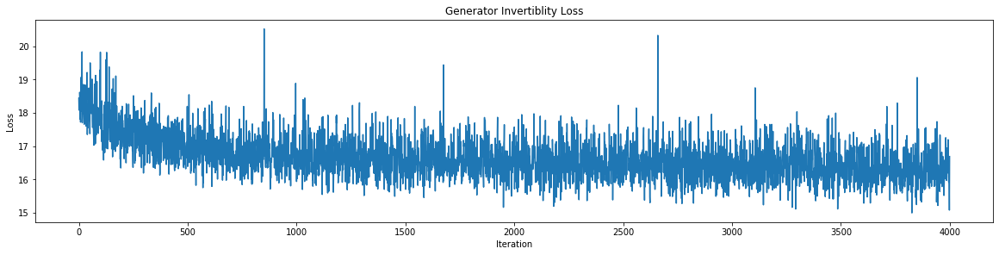

Real images:


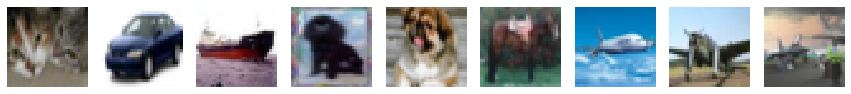

Reconstructed images:


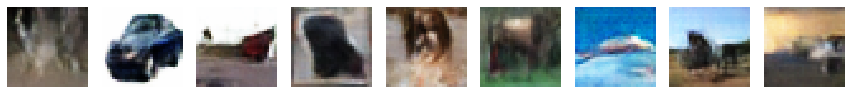

Reconstructed images after training:


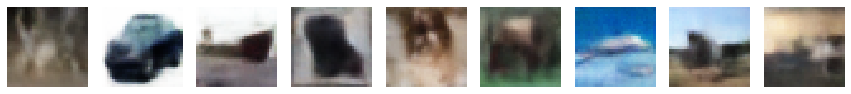

iter 19999	train disc cost	-2.5889151096343994	time	0.15685799999999997	inception score	5.71970272064209	dev disc cost	-1.4170000553131104
iter 20099	train disc cost	-3.055241584777832	time	0.156562	dev disc cost	-1.2279000282287598
iter 20199	train disc cost	-2.6285040378570557	time	0.15592399999999998	dev disc cost	-1.1068999767303467
iter 20299	train disc cost	-2.6917691230773926	time	0.156624	dev disc cost	-0.9567999839782715
iter 20399	train disc cost	-2.6418240070343018	time	0.15666700000000003	dev disc cost	-0.9811999797821045
iter 20499	train disc cost	-2.651320219039917	time	0.155922	dev disc cost	-1.0069999694824219
iter 20599	train disc cost	-2.6054749488830566	time	0.15681900000000001	dev disc cost	-0.9444000124931335
iter 20699	train disc cost	-2.645303964614868	time	0.155827	dev disc cost	-1.048699975013733
iter 20799	train disc cost	-2.580357313156128	time	0.156974	dev disc cost	-0.9887999892234802
iter 20899	train disc cost	-2.5778369903564453	time	0.156827	dev disc cos

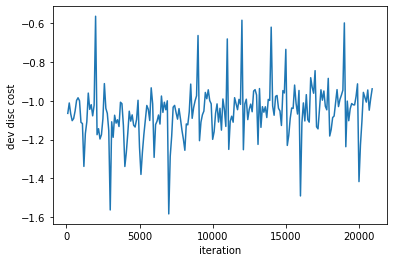

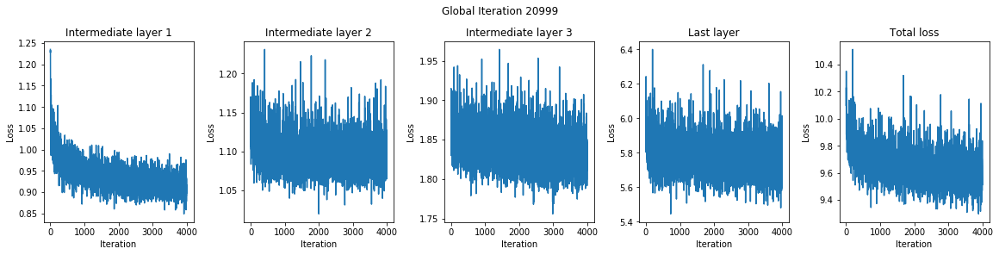

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


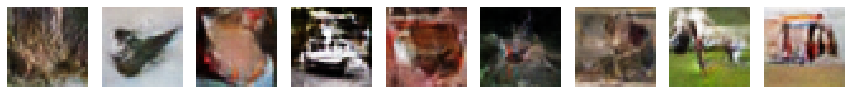

Reconstructed images:


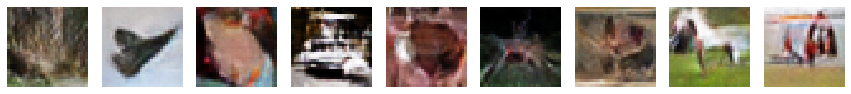

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


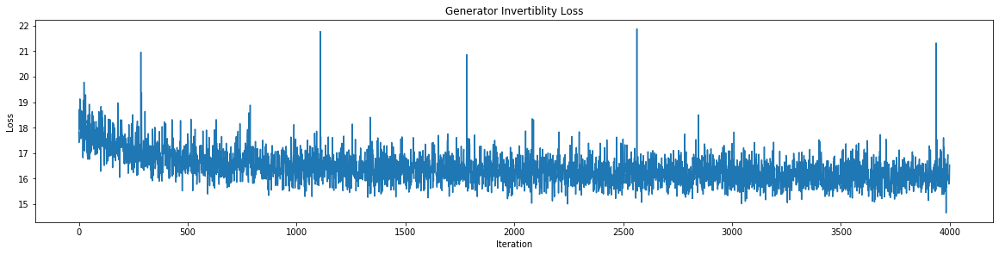

Real images:


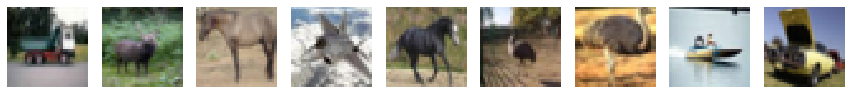

Reconstructed images:


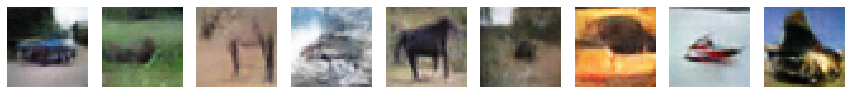

Reconstructed images after training:


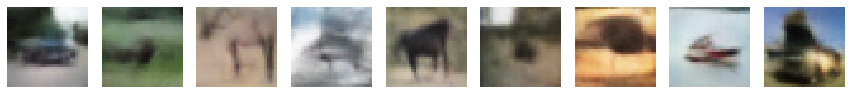

iter 20999	train disc cost	-2.617215871810913	time	0.156074	inception score	5.5551581382751465	dev disc cost	-1.3092000484466553
iter 21099	train disc cost	-3.1396484375	time	0.155809	dev disc cost	-1.2913999557495117
iter 21199	train disc cost	-2.7181432247161865	time	0.156588	dev disc cost	-1.131600022315979
iter 21299	train disc cost	-2.6378772258758545	time	0.15578499999999998	dev disc cost	-1.0297000408172607
iter 21399	train disc cost	-2.6584901809692383	time	0.156514	dev disc cost	-1.0190000534057617
iter 21499	train disc cost	-2.616762161254883	time	0.15634000000000003	dev disc cost	-1.0
iter 21599	train disc cost	-2.57414174079895	time	0.15590600000000002	dev disc cost	-0.9283000230789185
iter 21699	train disc cost	-2.6601696014404297	time	0.156808	dev disc cost	-0.9674999713897705
iter 21799	train disc cost	-2.62068510055542	time	0.156267	dev disc cost	-1.0256999731063843
iter 21899	train disc cost	-2.657334327697754	time	0.155982	dev disc cost	-0.9542999863624573
=========in

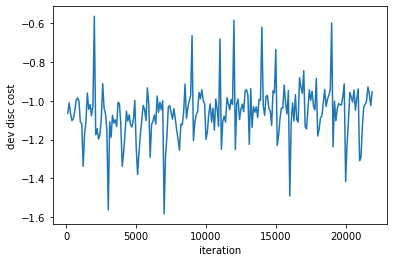

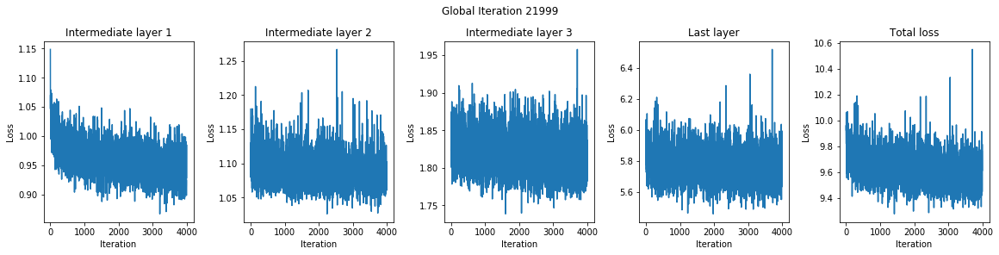

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


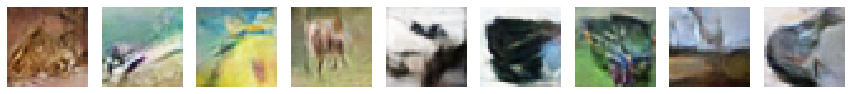

Reconstructed images:


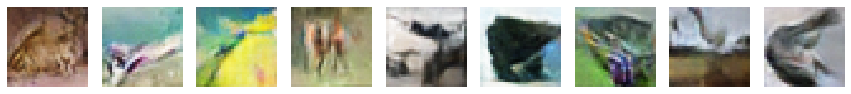

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


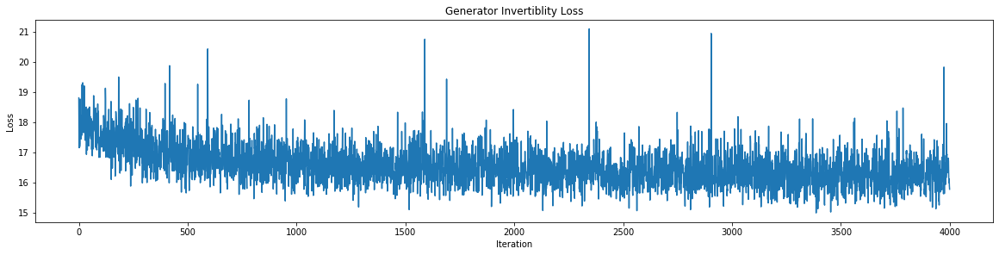

Real images:


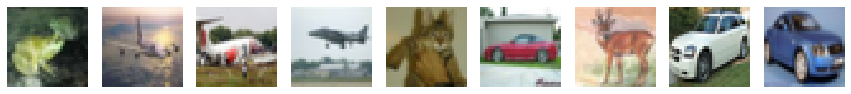

Reconstructed images:


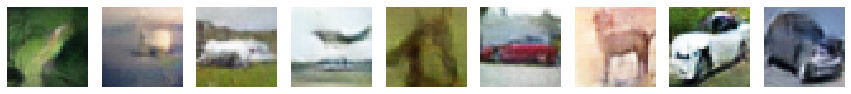

Reconstructed images after training:


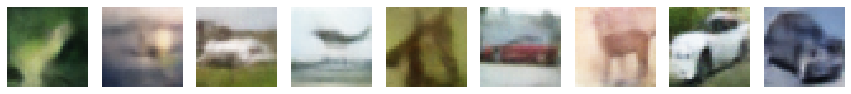

iter 21999	train disc cost	-2.6128571033477783	time	0.15638	inception score	5.567322731018066	dev disc cost	-0.8974999785423279
iter 22099	train disc cost	-3.0597546100616455	time	0.156375	dev disc cost	-1.2029999494552612
iter 22199	train disc cost	-2.642695903778076	time	0.15578999999999998	dev disc cost	-1.0780999660491943
iter 22299	train disc cost	-2.710275650024414	time	0.156552	dev disc cost	-0.9394000172615051
iter 22399	train disc cost	-2.6793549060821533	time	0.156484	dev disc cost	-0.9578999876976013
iter 22499	train disc cost	-2.677095890045166	time	0.155889	dev disc cost	-1.0068999528884888
iter 22599	train disc cost	-2.6473441123962402	time	0.156558	dev disc cost	-0.8906999826431274
iter 22699	train disc cost	-2.664072036743164	time	0.15645299999999998	dev disc cost	-0.9153000116348267
iter 22799	train disc cost	-2.5586910247802734	time	0.155816	dev disc cost	-1.0260000228881836
iter 22899	train disc cost	-2.623635768890381	time	0.15662900000000002	dev disc cost	-0.989099

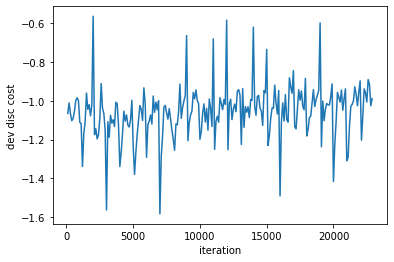

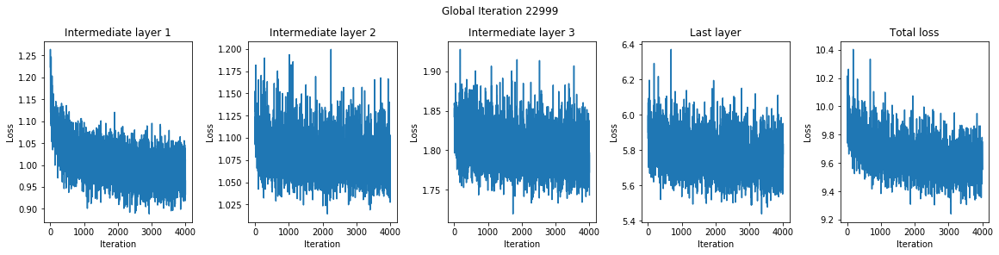

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


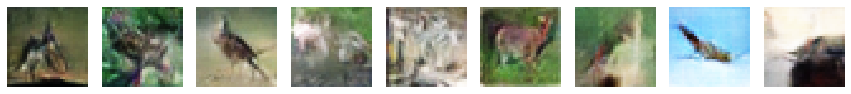

Reconstructed images:


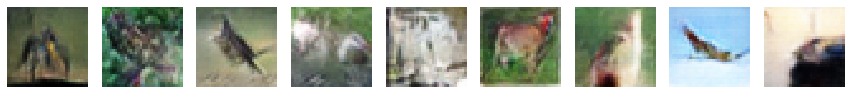

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


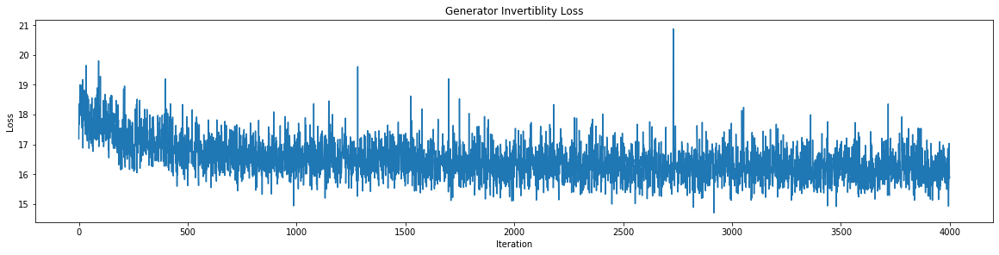

Real images:


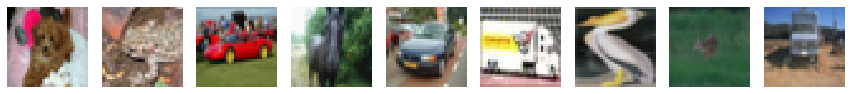

Reconstructed images:


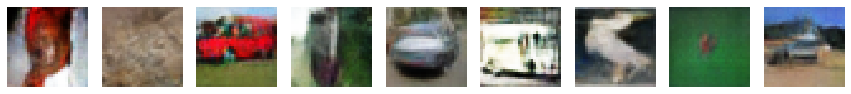

Reconstructed images after training:


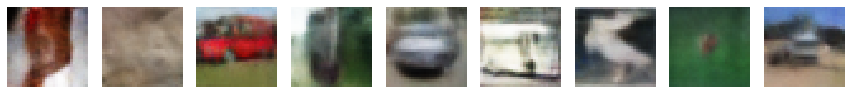

iter 22999	train disc cost	-2.6270644664764404	time	0.15578	inception score	5.900604724884033	dev disc cost	-0.2973000109195709
iter 23099	train disc cost	-3.122479200363159	time	0.155769	dev disc cost	-1.1511000394821167
iter 23199	train disc cost	-2.70399808883667	time	0.15669900000000003	dev disc cost	-0.9871000051498413
iter 23299	train disc cost	-2.6727707386016846	time	0.15576099999999998	dev disc cost	-1.0769000053405762
iter 23399	train disc cost	-2.672247886657715	time	0.156593	dev disc cost	-1.0463999509811401
iter 23499	train disc cost	-2.6470229625701904	time	0.15640700000000002	dev disc cost	-0.9825999736785889
iter 23599	train disc cost	-2.6383402347564697	time	0.155746	dev disc cost	-0.8784000277519226
iter 23699	train disc cost	-2.6218607425689697	time	0.156712	dev disc cost	-0.9957000017166138
iter 23799	train disc cost	-2.664991855621338	time	0.15637299999999996	dev disc cost	-0.9908999800682068
iter 23899	train disc cost	-2.626485824584961	time	0.155761	dev disc cost

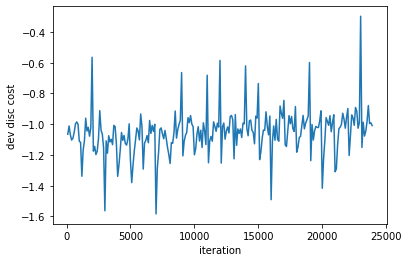

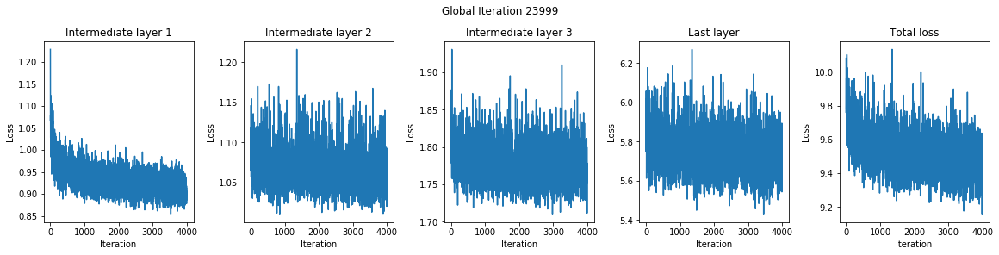

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


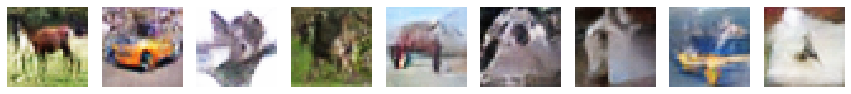

Reconstructed images:


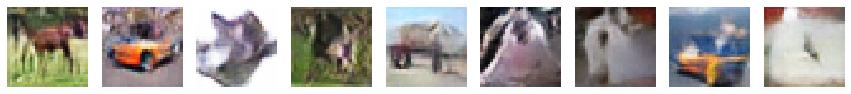

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


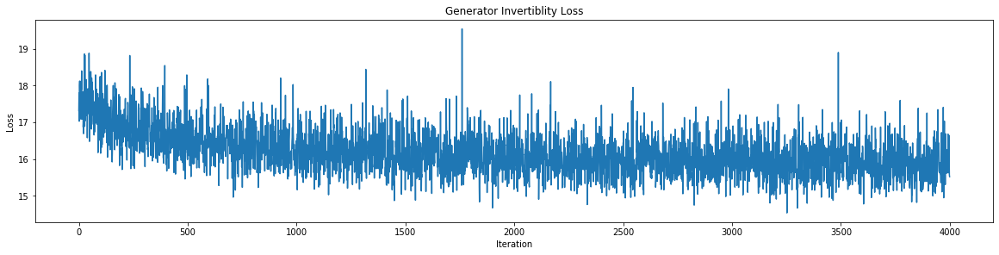

Real images:


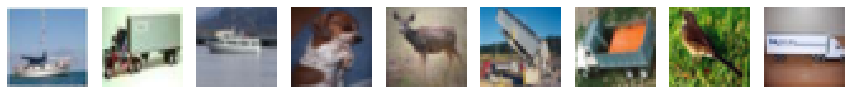

Reconstructed images:


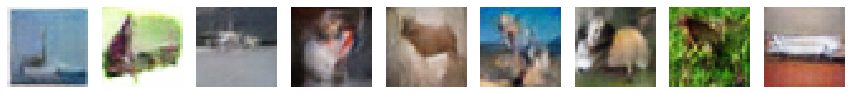

Reconstructed images after training:


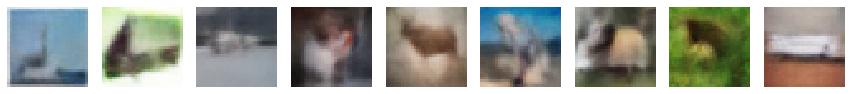

iter 23999	train disc cost	-2.6008670330047607	time	0.15660799999999997	inception score	5.574817657470703	dev disc cost	-1.145799994468689
iter 24099	train disc cost	-3.1098058223724365	time	0.156515	dev disc cost	-1.0842000246047974
iter 24199	train disc cost	-2.6825428009033203	time	0.155855	dev disc cost	-0.9692000150680542
iter 24299	train disc cost	-2.6534183025360107	time	0.156556	dev disc cost	-1.0148999691009521
iter 24399	train disc cost	-2.6888175010681152	time	0.156578	dev disc cost	-1.0053000450134277
iter 24499	train disc cost	-2.687856674194336	time	0.155799	dev disc cost	-0.9954000115394592
iter 24599	train disc cost	-2.6339731216430664	time	0.156546	dev disc cost	-0.9616000056266785
iter 24699	train disc cost	-2.5909838676452637	time	0.156349	dev disc cost	-0.9423999786376953
iter 24799	train disc cost	-2.646637201309204	time	0.15564799999999998	dev disc cost	-0.8891000151634216
iter 24899	train disc cost	-2.5797860622406006	time	0.156616	dev disc cost	-1.02750003337860

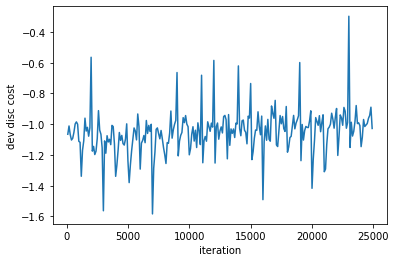

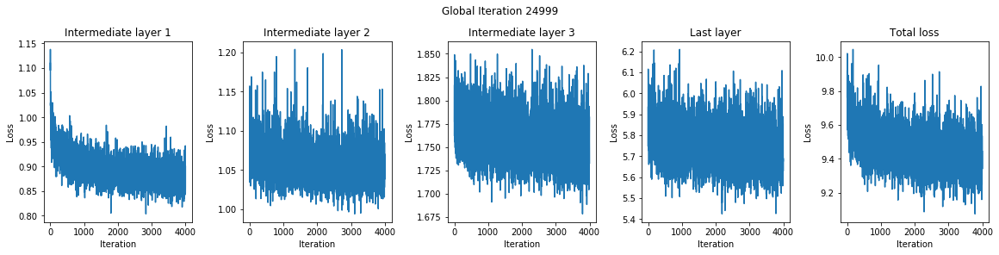

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


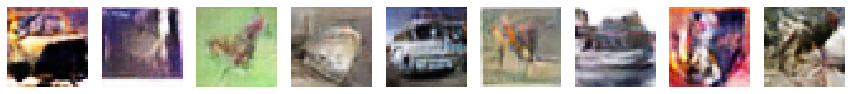

Reconstructed images:


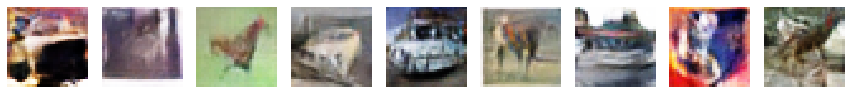

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


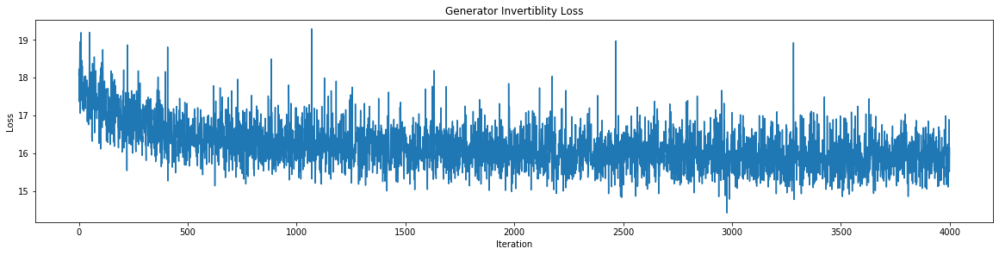

Real images:


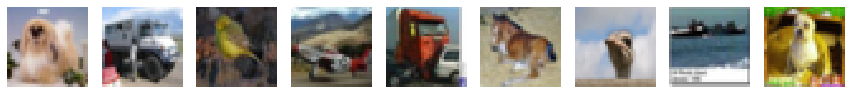

Reconstructed images:


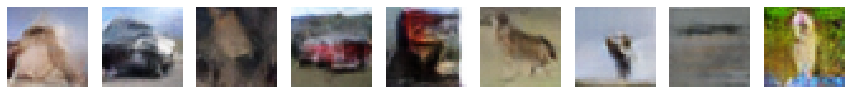

Reconstructed images after training:


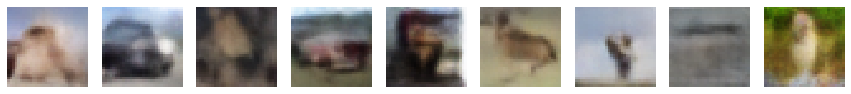

iter 24999	train disc cost	-2.629721164703369	time	0.15659299999999998	inception score	5.581507682800293	dev disc cost	-0.9740999937057495
iter 25099	train disc cost	-3.1071219444274902	time	0.15572800000000003	dev disc cost	-1.1861000061035156
iter 25199	train disc cost	-2.7227582931518555	time	0.15647699999999998	dev disc cost	-1.1044000387191772
iter 25299	train disc cost	-2.6953649520874023	time	0.15637	dev disc cost	-1.0875999927520752
iter 25399	train disc cost	-2.6713201999664307	time	0.15598	dev disc cost	-1.066499948501587
iter 25499	train disc cost	-2.6401901245117188	time	0.15665400000000002	dev disc cost	-0.9678000211715698
iter 25599	train disc cost	-2.5635759830474854	time	0.156013	dev disc cost	-0.9528999924659729
iter 25699	train disc cost	-2.6272876262664795	time	0.156586	dev disc cost	-0.9283999800682068
iter 25799	train disc cost	-2.6613242626190186	time	0.15657	dev disc cost	-1.0550999641418457
iter 25899	train disc cost	-2.647033929824829	time	0.15596400000000002	d

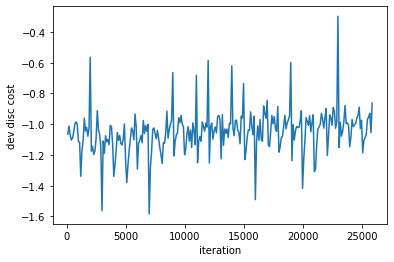

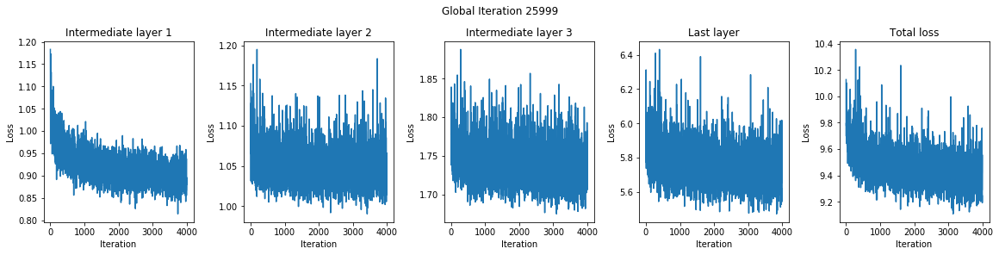

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


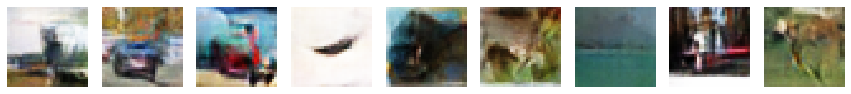

Reconstructed images:


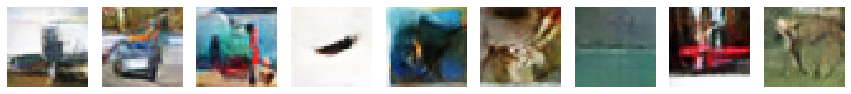

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


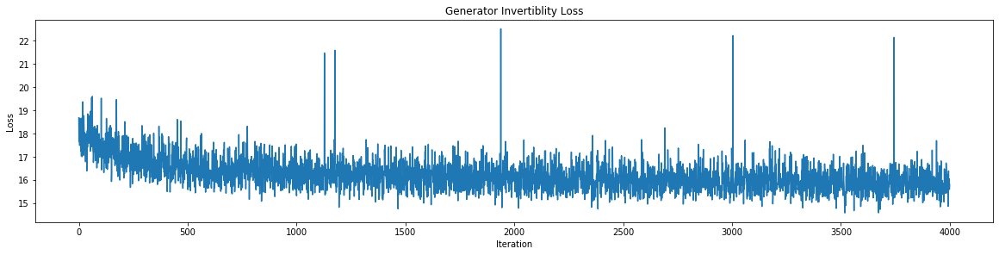

Real images:


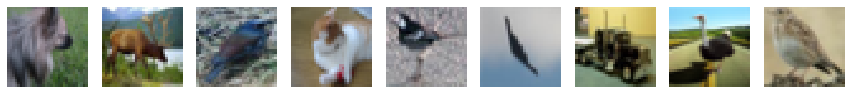

Reconstructed images:


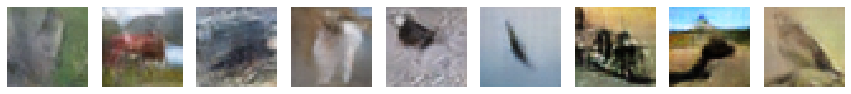

Reconstructed images after training:


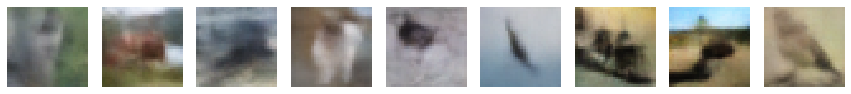

iter 25999	train disc cost	-2.662388801574707	time	0.156845	inception score	5.784193992614746	dev disc cost	-0.848800003528595
iter 26099	train disc cost	-3.1115777492523193	time	0.156384	dev disc cost	-1.166100025177002
iter 26199	train disc cost	-2.692378282546997	time	0.15583299999999997	dev disc cost	-1.1128000020980835
iter 26299	train disc cost	-2.7259130477905273	time	0.156635	dev disc cost	-0.9517999887466431
iter 26399	train disc cost	-2.7026617527008057	time	0.156754	dev disc cost	-0.9783999919891357
iter 26499	train disc cost	-2.6339690685272217	time	0.155481	dev disc cost	-0.9135000109672546
iter 26599	train disc cost	-2.662163019180298	time	0.15645	dev disc cost	-0.9157999753952026
iter 26699	train disc cost	-2.650658369064331	time	0.15648999999999996	dev disc cost	-0.8852999806404114
iter 26799	train disc cost	-2.6608145236968994	time	0.155772	dev disc cost	-0.9998999834060669
iter 26899	train disc cost	-2.6155507564544678	time	0.156686	dev disc cost	-0.9363999962806702
=

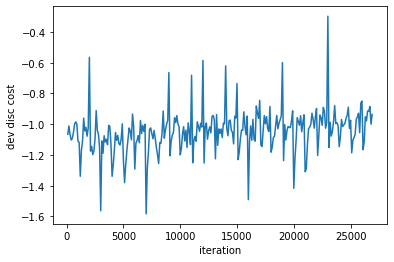

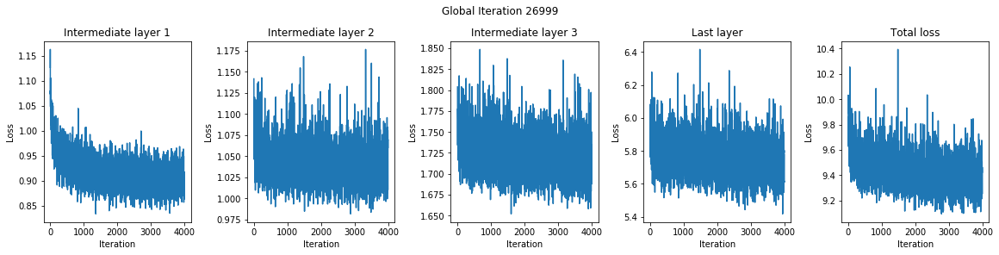

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


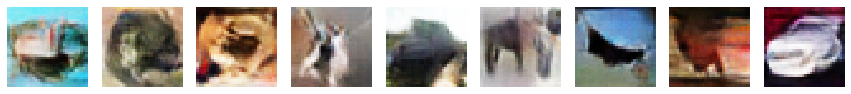

Reconstructed images:


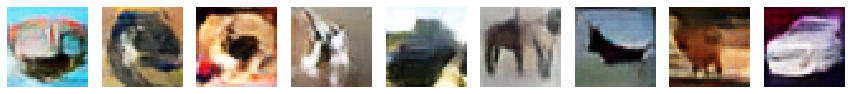

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


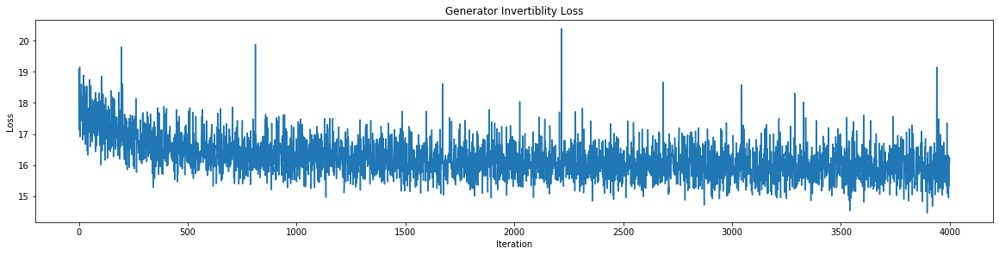

Real images:


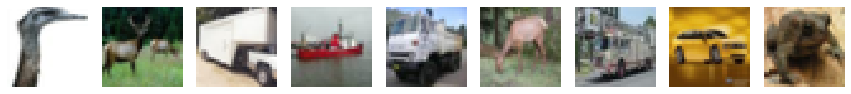

Reconstructed images:


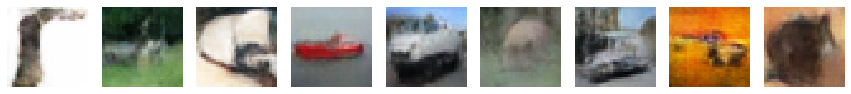

Reconstructed images after training:


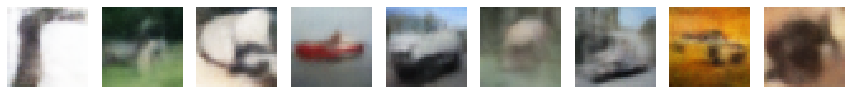

iter 26999	train disc cost	-2.6244678497314453	time	0.15655199999999997	inception score	5.7300591468811035	dev disc cost	-1.4213999509811401
iter 27099	train disc cost	-3.122403144836426	time	0.155632	dev disc cost	-1.2007999420166016
iter 27199	train disc cost	-2.720628023147583	time	0.156632	dev disc cost	-1.0038000345230103
iter 27299	train disc cost	-2.679684638977051	time	0.15673700000000002	dev disc cost	-0.9322999715805054
iter 27399	train disc cost	-2.679457187652588	time	0.155865	dev disc cost	-0.982200026512146
iter 27499	train disc cost	-2.6800200939178467	time	0.156474	dev disc cost	-0.975600004196167
iter 27599	train disc cost	-2.659548282623291	time	0.156596	dev disc cost	-1.0384999513626099
iter 27699	train disc cost	-2.6342861652374268	time	0.15587600000000001	dev disc cost	-0.9825999736785889
iter 27799	train disc cost	-2.6852617263793945	time	0.15658399999999997	dev disc cost	-0.9519000053405762
iter 27899	train disc cost	-2.6803178787231445	time	0.155778	dev disc cos

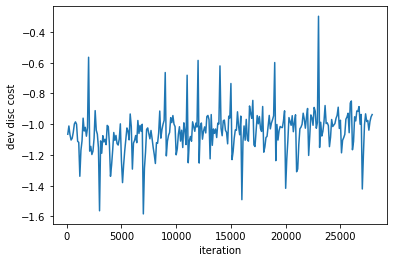

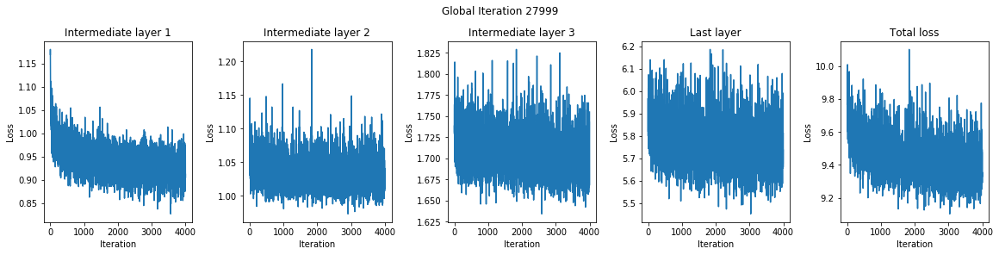

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


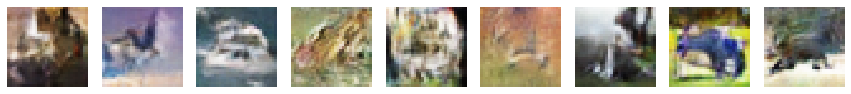

Reconstructed images:


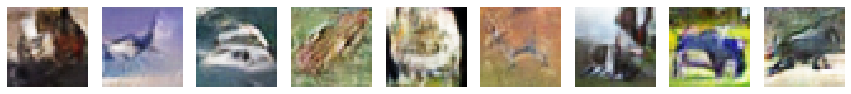

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400
Generator Invertiblity Training: 800
Generator Invertiblity Training: 1200
Generator Invertiblity Training: 1600
Generator Invertiblity Training: 2000
Generator Invertiblity Training: 2400
Generator Invertiblity Training: 2800
Generator Invertiblity Training: 3200
Generator Invertiblity Training: 3600


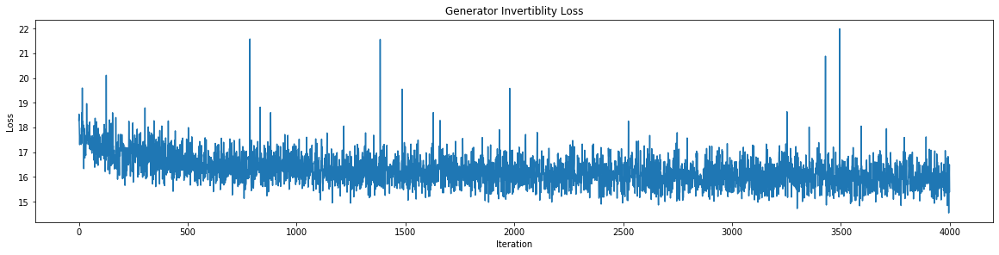

Real images:


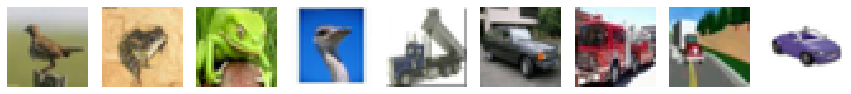

Reconstructed images:


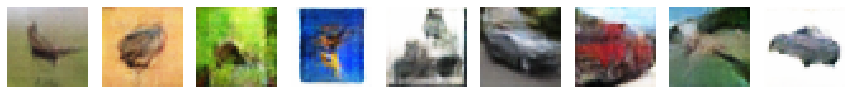

Reconstructed images after training:


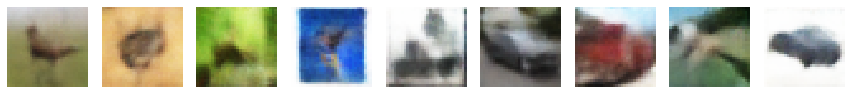

iter 27999	train disc cost	-2.592741012573242	time	0.15661899999999998	inception score	5.671906471252441	dev disc cost	-1.2860000133514404
iter 28099	train disc cost	-3.0863170623779297	time	0.156524	dev disc cost	-1.0972000360488892
iter 28199	train disc cost	-2.720630168914795	time	0.15566499999999997	dev disc cost	-1.0786999464035034
iter 28299	train disc cost	-2.7403745651245117	time	0.15642	dev disc cost	-1.0799000263214111
iter 28399	train disc cost	-2.693124771118164	time	0.15658799999999998	dev disc cost	-0.8978999853134155
iter 28499	train disc cost	-2.7007696628570557	time	0.155627	dev disc cost	-0.9580000042915344
iter 28599	train disc cost	-2.685802936553955	time	0.156641	dev disc cost	-0.9115999937057495
iter 28699	train disc cost	-2.6704211235046387	time	0.156451	dev disc cost	-1.0187000036239624
iter 28799	train disc cost	-2.641655206680298	time	0.155667	dev disc cost	-1.1035000085830688
iter 28899	train disc cost	-2.630178213119507	time	0.15655199999999997	dev disc cost

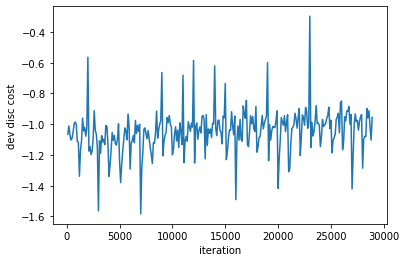

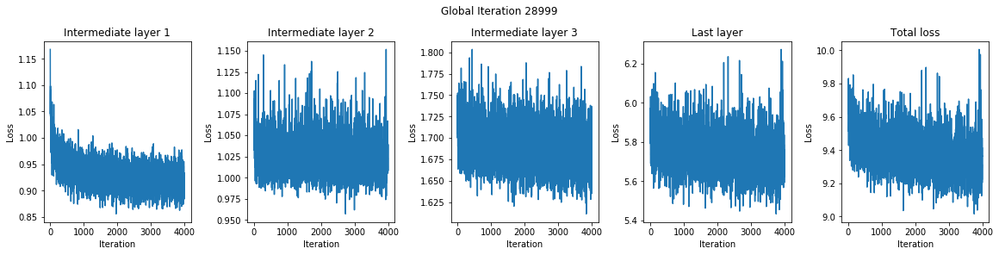

Encoder is trained
===================== Reconstruction of the generated images:
Generated images:


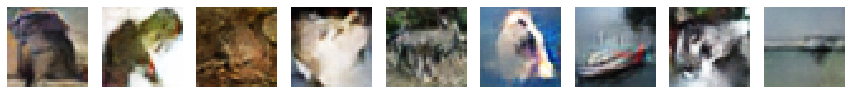

Reconstructed images:


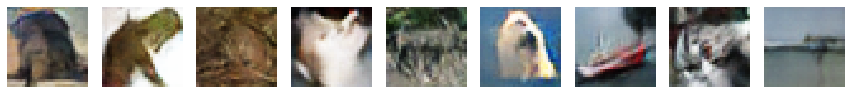

===================== Reconstruction of the real images:
Training the Generator for Invertiblity
Generator Invertiblity Training: 0
Generator Invertiblity Training: 400


In [ ]:
# Train loop
saver = tf.train.Saver()
with tf.Session() as session:
    
    enc_iters=4000
    gen_inv_iters=4000
    if resume==True:
        print('Restoring the model:')
        #saver = tf.train.import_meta_graph('saved_model/wgan_impr.meta')
        saver.restore(session, tf.train.latest_checkpoint(model_path))
        print('Model is restored.')
        
    else:
        session.run(tf.initialize_all_variables())
    
    #initialize the encoder 
    #tf.variables_initializer(enc_params)
    
    gen = inf_train_gen()

    for iteration in range(ITERS):
        start_time = time.time()
            
        # Train generator
        if iteration > 0:
            _ = session.run(gen_train_op)
        # Train critic
        if MODE == 'dcgan':
            disc_iters = 1
        else:
            disc_iters = CRITIC_ITERS
        for i in range(disc_iters):
            _data = next(gen)
            _disc_cost, _ = session.run([disc_cost, disc_train_op], 
                                        feed_dict={real_data_int: _data})
            if MODE == 'wgan':
                _ = session.run(clip_disc_weights)

        lib.plot.plot('train disc cost', round(_disc_cost,4) )
        lib.plot.plot('time', round(time.time() - start_time,4) )

        # Calculate inception score every 1K iters
        if iteration % 1000 == 999:
            inception_score = get_inception_score()
            lib.plot.plot('inception score', inception_score[0])
            print('Saving the Model:')
            saver.save(session, model_path+'wgan_impr')
            print('Model is saved.')
            
        # Calculate the encoder score every 1K iters
        if ((iteration % 1000 == 999) and train_enc and (inception_score[0]>0.0)):
            print("Training the Encoder")
            enc_inv_gen_cost_list_np_Arx=[]
            enc_inv_gen_cost_np_Arx=[]
            for j in range(enc_iters):
                enc_inv_gen_cost_list_np, enc_inv_gen_cost_np, _ = session.run([enc_inv_gen_cost_list,
                                                                                    enc_inv_gen_cost,
                                                                            enc_inv_gen_train_enc_op])
                
                enc_inv_gen_cost_list_np_Arx.append(enc_inv_gen_cost_list_np)
                enc_inv_gen_cost_np_Arx.append(enc_inv_gen_cost_np)
                if j % 200 ==0:  print('Encoder Training:', j)
                    
            plot_enc_loss(enc_inv_gen_cost_list_np_Arx, enc_inv_gen_cost_np_Arx, iteration)
            print("Encoder is trained")
            
            print("===================== Reconstruction of the generated images:")
            #fake_data_np, recon_fake_np = session.run([fake_data_samples, recon_fake_samples],
            #                                feed_dict={noise_pl: np.random.normal(size=[32, DIM])})
            fake_data_np, recon_fake_np = session.run([fake_data, recon_fake])

            print("Generated images:")
            fake_data_np = ((fake_data_np[0:9]+1.)*(255./2)).astype('int32')
            tile(fake_data_np.reshape((-1, 3, 32, 32)).transpose(0,2,3,1), grid=(1,9), size=15)
            plt.show()
            print("Reconstructed images:")
            recon_fake_np = ((recon_fake_np[0:9]+1.)*(255./2)).astype('int32')
            tile(recon_fake_np.reshape((-1, 3, 32, 32)).transpose(0,2,3,1), grid=(1,9), size=15)
            plt.show()
            
            print("===================== Reconstruction of the real images:")
            _data = next(gen)
            fixed_data=_data.copy()
            recon_real_np = session.run(recon_real, feed_dict={real_data_int: fixed_data})
            
            print("Training the Generator for Invertiblity")
            gen_recon_cost_np_Arx=[]
            for j in range(gen_inv_iters):
                _data = next(gen)
                gen_recon_cost_np, _ = session.run([gen_recon_cost, gen_recon_cost_op],
                                                                 feed_dict={real_data_int: _data})
                gen_recon_cost_np_Arx.append(gen_recon_cost_np)
                if j % 400 ==0: print('Generator Invertiblity Training:', j)
            
            fig, axs = plt.subplots(1, 1, constrained_layout=True, squeeze=True, figsize=(16, 4))
            axs.plot(gen_recon_cost_np_Arx)
            axs.set_title('Generator Invertiblity Loss')
            axs.set_xlabel('Iteration')
            axs.set_ylabel('Loss')
            plt.show()
            
            recon_real_2_np = session.run(recon_real, feed_dict={real_data_int: fixed_data})
            
            print("Real images:")
            #_data = ((_data[0:18]+1.)*(255./2)).astype('int32')
            tile(fixed_data[0:9].reshape((-1, 3, 32, 32)).transpose(0,2,3,1), grid=(1,9), size=15)
            plt.show()
            print("Reconstructed images:")
            recon_real_np = ((recon_real_np[0:9]+1.)*(255./2)).astype('int32')
            tile(recon_real_np.reshape((-1, 3, 32, 32)).transpose(0,2,3,1), grid=(1,9), size=15)
            plt.show()
            print("Reconstructed images after training:")
            recon_real_2_np = ((recon_real_2_np[0:9]+1.)*(255./2)).astype('int32')
            tile(recon_real_2_np.reshape((-1, 3, 32, 32)).transpose(0,2,3,1), grid=(1,9), size=15)
            plt.show()
            

            
            
        # Calculate dev loss and generate samples every 100 iters
        if iteration % 100 == 99:
            dev_disc_costs = []
            for images,_ in dev_gen():
                _dev_disc_cost = session.run(disc_cost, feed_dict={real_data_int: images}) 
                dev_disc_costs.append(round(_dev_disc_cost, 4) )
            lib.plot.plot('dev disc cost', round(np.mean(dev_disc_costs),4))
            generate_image(iteration, _data)

        # Save logs every 100 iters
        if (iteration < 5) or (iteration % 100 == 99):
            lib.plot.flush()

        lib.plot.tick()

In [ ]:
_data.shape